In [ ]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

Epoch 100/500 - D Loss: 1.1706, G Loss: 1.1710


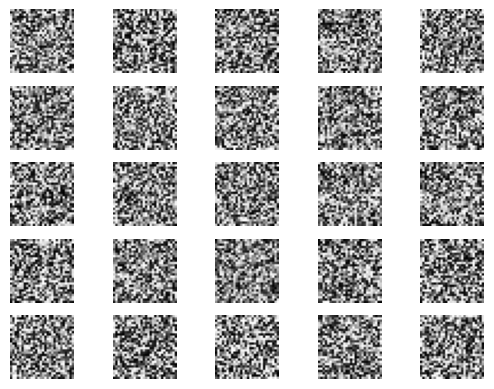

Epoch 200/500 - D Loss: 1.3526, G Loss: 1.3533


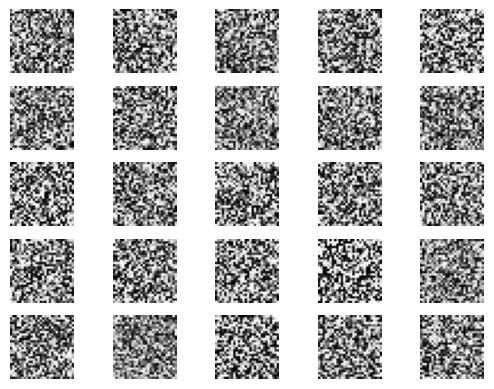

Epoch 300/500 - D Loss: 1.5379, G Loss: 1.5389


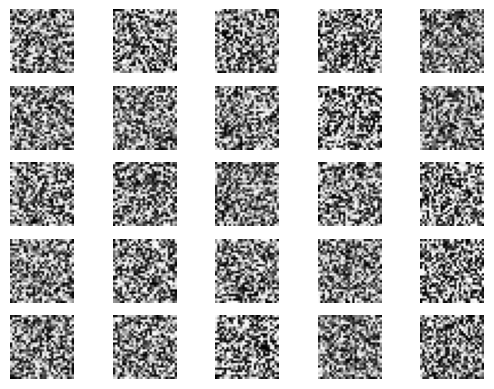

Epoch 400/500 - D Loss: 1.7136, G Loss: 1.7145


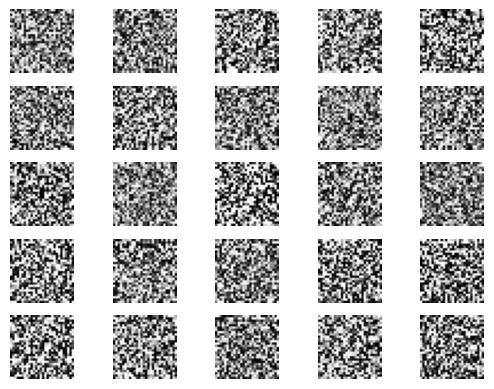

Epoch 500/500 - D Loss: 1.8663, G Loss: 1.8672


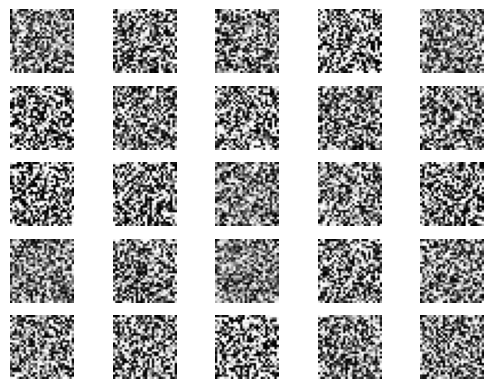

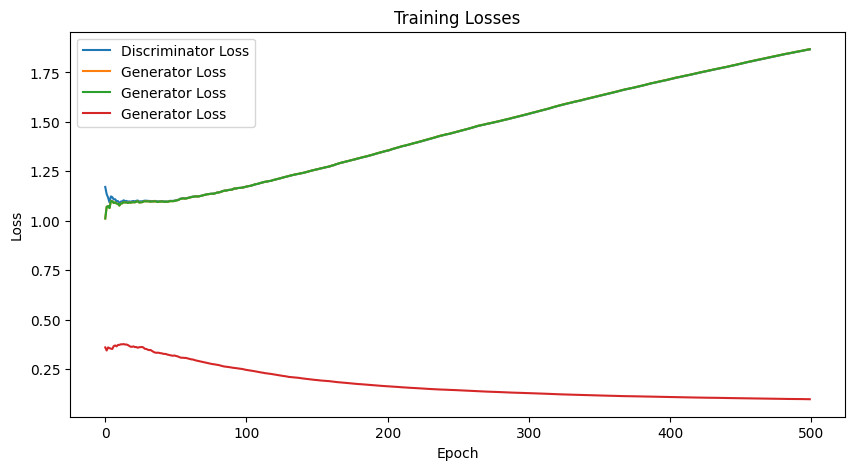

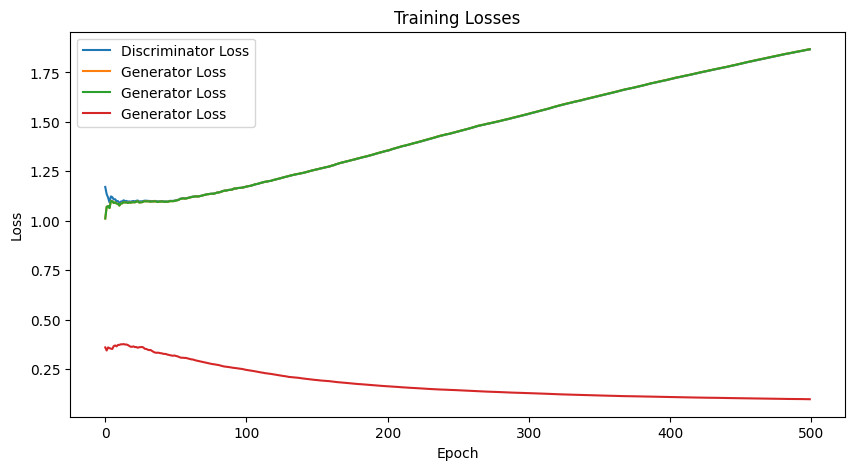

In [3]:
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, LeakyReLU, Flatten, Reshape, BatchNormalization, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.datasets import mnist

# Load and preprocess the MNIST dataset
(x_train, _), (_, _) = mnist.load_data()
x_train = (x_train.astype(np.float32) - 127.5) / 127.5  # Normalize to range [-1, 1]
x_train = np.expand_dims(x_train, axis=-1)  # Add channel dimension

# Constants
IMG_SHAPE = (28, 28, 1)
LATENT_DIM = 100
BATCH_SIZE = 64
EPOCHS = 500

# Build the generator with BatchNormalization and Dropout
def build_generator():
    model = Sequential([
        Dense(256, activation='relu', input_dim=LATENT_DIM),
        BatchNormalization(momentum=0.8),
        Dense(512, activation='relu'),
        BatchNormalization(momentum=0.8),
        Dense(1024, activation='relu'),
        BatchNormalization(momentum=0.8),
        Dense(np.prod(IMG_SHAPE), activation='tanh'),
        Reshape(IMG_SHAPE)
    ])
    return model

# Build the discriminator with Dropout
def build_discriminator():
    model = Sequential([
        Flatten(input_shape=IMG_SHAPE),
        Dense(1024),
        LeakyReLU(alpha=0.2),
        Dropout(0.3),
        Dense(512),
        LeakyReLU(alpha=0.2),
        Dropout(0.3),
        Dense(256),
        LeakyReLU(alpha=0.2),
        Dropout(0.3),
        Dense(1, activation='sigmoid')
    ])
    return model

# Compile the models
generator = build_generator()
discriminator = build_discriminator()
discriminator.compile(optimizer=Adam(learning_rate=0.0002, beta_1=0.5), loss='binary_crossentropy', metrics=['accuracy'])

# Build and compile the GAN model
def build_gan(generator, discriminator):
    model = Sequential([generator, discriminator])
    discriminator.trainable = False
    model.compile(optimizer=Adam(learning_rate=0.0002, beta_1=0.5), loss='binary_crossentropy')
    return model

gan = build_gan(generator, discriminator)

# Training function
def train():
    d_losses = []
    g_losses = []

    for epoch in range(EPOCHS):
        # Train discriminator
        idx = np.random.randint(0, x_train.shape[0], BATCH_SIZE // 2)
        real_imgs = x_train[idx]

        noise = np.random.normal(0, 1, (BATCH_SIZE // 2, LATENT_DIM))
        fake_imgs = generator.predict(noise,verbose=0)

        real_labels = np.ones((BATCH_SIZE // 2, 1))
        fake_labels = np.zeros((BATCH_SIZE // 2, 1))

        d_loss_real = discriminator.train_on_batch(real_imgs, real_labels)
        d_loss_fake = discriminator.train_on_batch(fake_imgs, fake_labels)
        d_loss = 0.5 * np.add(d_loss_real, d_loss_fake)

        # Train generator
        noise = np.random.normal(0, 1, (BATCH_SIZE, LATENT_DIM))
        valid_y = np.ones((BATCH_SIZE, 1))
        g_loss = gan.train_on_batch(noise, valid_y)

        d_losses.append(d_loss[0])
        g_losses.append(g_loss)

        # Print progress and display images every 1000 epochs
        # Print progress and display images every 1000 epochs
        if (epoch + 1) % 100 == 0:
            print(f"Epoch {(epoch + 1)}/{EPOCHS} - D Loss: {d_loss[0]:.4f}, G Loss: {g_loss[0]:.4f}")
            sample_images(generator)


    return d_losses, g_losses

# Function to generate and display images
def sample_images(generator, n=5):
    noise = np.random.normal(0, 1, (n * n, LATENT_DIM))
    gen_imgs = generator.predict(noise,verbose=0)
    gen_imgs = 0.5 * gen_imgs + 0.5  # Rescale to [0, 1]

    fig, axs = plt.subplots(n, n)
    cnt = 0
    for i in range(n):
        for j in range(n):
            axs[i, j].imshow(gen_imgs[cnt, :, :, 0], cmap='gray')
            axs[i, j].axis('off')
            cnt += 1
    plt.show()

# Train the GAN model
d_losses, g_losses = train()

# Plot training losses
plt.figure(figsize=(10, 5))
plt.plot(d_losses, label="Discriminator Loss")
plt.plot(g_losses, label="Generator Loss")
plt.title("Training Losses")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()
plt.show()





Epoch 2/10 - D Loss: 0.7384, G Loss: 0.7587


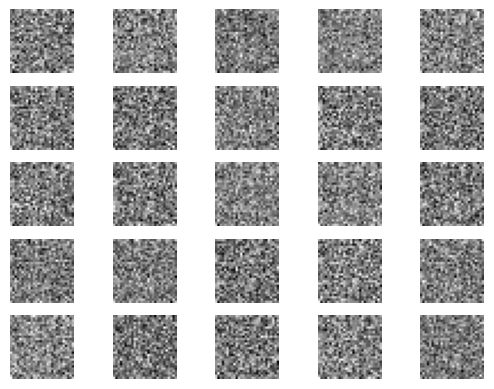

Epoch 4/10 - D Loss: 0.8285, G Loss: 0.8615


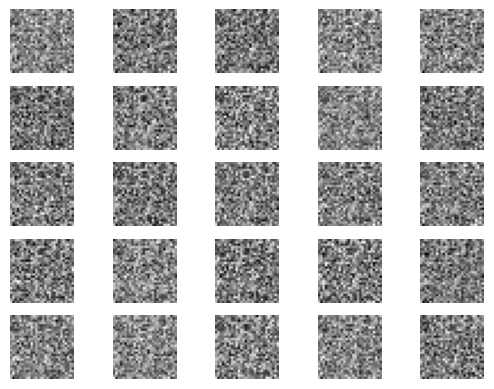

Epoch 6/10 - D Loss: 0.9500, G Loss: 0.9930


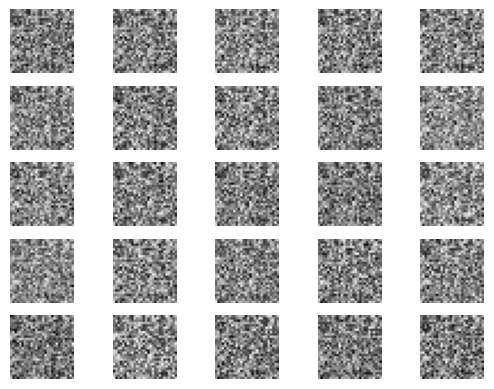

Epoch 8/10 - D Loss: 1.0971, G Loss: 1.1485


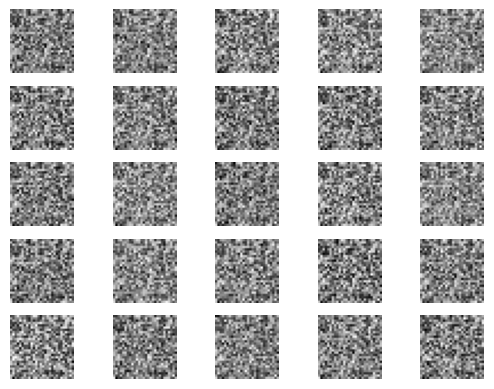

Epoch 10/10 - D Loss: 1.2550, G Loss: 1.3071


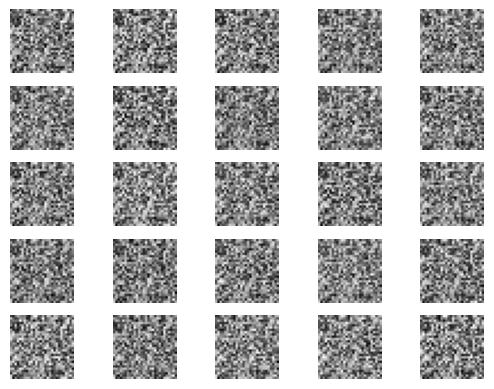

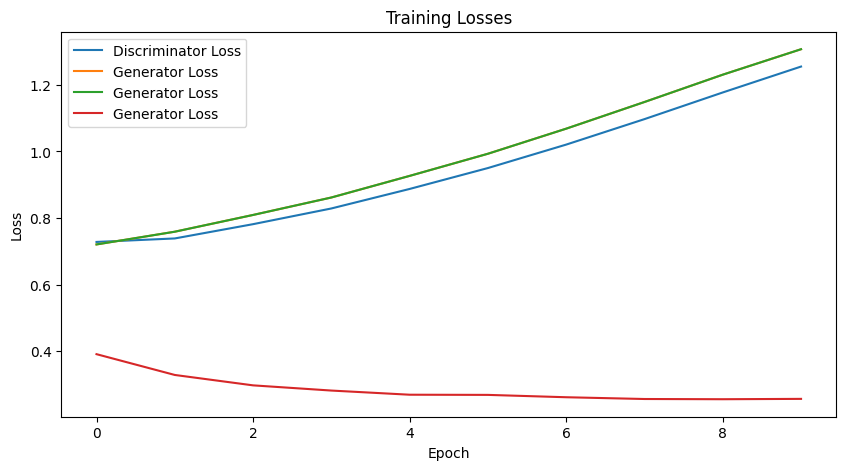

In [40]:
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, LeakyReLU, Flatten, Reshape
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.datasets import mnist

# Load and preprocess the MNIST dataset
(x_train, _), (_, _) = mnist.load_data()
x_train = (x_train.astype(np.float32) - 127.5) / 127.5  # Normalize to range [-1, 1]
x_train = x_train.reshape(x_train.shape[0], -1)  # Flatten the images

# Constants
IMG_SHAPE = (784,)  # Flattened MNIST image shape
LATENT_DIM = 100
BATCH_SIZE = 64
EPOCHS = 10

# Build the generator
def build_generator():
    model = Sequential([
        Dense(256, input_dim=LATENT_DIM),
        LeakyReLU(alpha=0.2),
        Dense(512),
        LeakyReLU(alpha=0.2),
        Dense(1024),
        LeakyReLU(alpha=0.2),
        Dense(np.prod(IMG_SHAPE), activation='tanh')
    ])
    return model

# Build the discriminator
def build_discriminator():
    model = Sequential([
        Dense(1024, input_shape=IMG_SHAPE),
        LeakyReLU(alpha=0.2),
        Dense(512),
        LeakyReLU(alpha=0.2),
        Dense(256),
        LeakyReLU(alpha=0.2),
        Dense(1, activation='sigmoid')
    ])
    return model

# Compile the models
generator = build_generator()
discriminator = build_discriminator()
discriminator.compile(optimizer=Adam(learning_rate=0.0002, beta_1=0.5), loss='binary_crossentropy', metrics=['accuracy'])

def build_gan(generator, discriminator):
    discriminator.trainable = False
    model = Sequential([generator, discriminator])
    model.compile(optimizer=Adam(learning_rate=0.0002, beta_1=0.5), loss='binary_crossentropy')
    return model

gan = build_gan(generator, discriminator)

# Training function
def train():
    d_losses = []
    g_losses = []

    for epoch in range(EPOCHS):
        # Train discriminator
        idx = np.random.randint(0, x_train.shape[0], BATCH_SIZE // 2)
        real_imgs = x_train[idx]

        noise = np.random.normal(0, 1, (BATCH_SIZE // 2, LATENT_DIM))
        fake_imgs = generator.predict(noise, verbose=0)

        real_labels = np.ones((BATCH_SIZE // 2, 1))
        fake_labels = np.zeros((BATCH_SIZE // 2, 1))

        d_loss_real = discriminator.train_on_batch(real_imgs, real_labels)
        d_loss_fake = discriminator.train_on_batch(fake_imgs, fake_labels)
        d_loss = 0.5 * np.add(d_loss_real, d_loss_fake)  # NumPy array

        # Train generator
        noise = np.random.normal(0, 1, (BATCH_SIZE, LATENT_DIM))
        valid_y = np.ones((BATCH_SIZE, 1))
        g_loss = gan.train_on_batch(noise, valid_y)  # Scalar value

        # Append losses
        d_losses.append(d_loss[0])
        g_losses.append(g_loss)

        # Print progress and display images every 1000 epochs
        # Print progress and display images every 1000 epochs
        if (epoch + 1) % 2 == 0:
            print(f"Epoch {(epoch + 1)}/{EPOCHS} - D Loss: {d_loss[0]:.4f}, G Loss: {g_loss[0]:.4f}")
            sample_images(generator)

    return d_losses, g_losses



# Function to generate and display images
def sample_images(generator, n=5):
    noise = np.random.normal(0, 1, (n * n, LATENT_DIM))
    gen_imgs = generator.predict(noise, verbose=0)
    gen_imgs = 0.5 * gen_imgs + 0.5  # Rescale to [0, 1]

    fig, axs = plt.subplots(n, n)
    cnt = 0
    for i in range(n):
        for j in range(n):
            axs[i, j].imshow(gen_imgs[cnt].reshape(28, 28), cmap='gray')
            axs[i, j].axis('off')
            cnt += 1
    plt.show()

# Train the GAN model
d_losses, g_losses = train()

# Plot training losses
plt.figure(figsize=(10, 5))
plt.plot(d_losses, label="Discriminator Loss")
plt.plot(g_losses, label="Generator Loss")
plt.title("Training Losses")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()
plt.show()


Epoch 10/100 - D Loss: 1.0899, G Loss: 1.1430


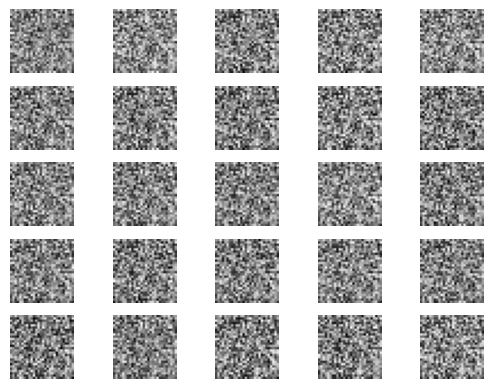

Epoch 20/100 - D Loss: 1.7154, G Loss: 1.7554


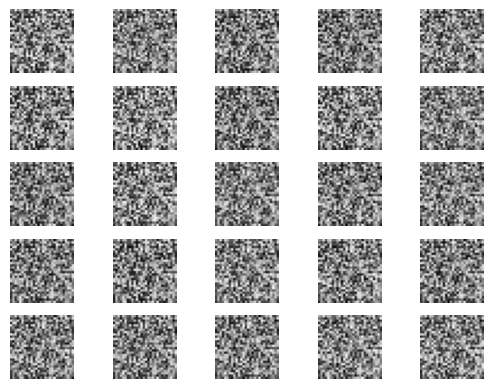

Epoch 30/100 - D Loss: 2.1006, G Loss: 2.1310


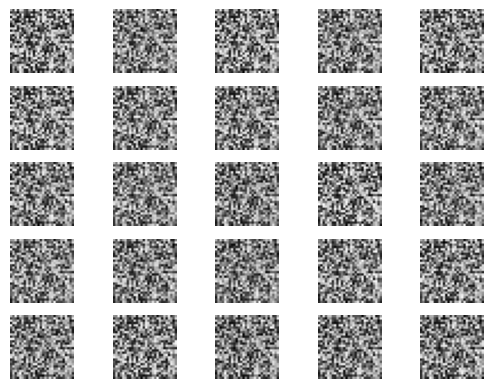

Epoch 40/100 - D Loss: 2.3729, G Loss: 2.3974


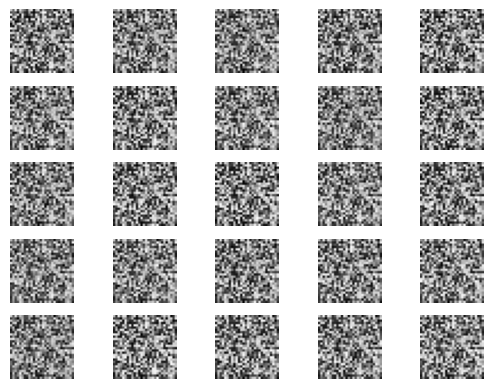

Epoch 50/100 - D Loss: 2.5821, G Loss: 2.6015


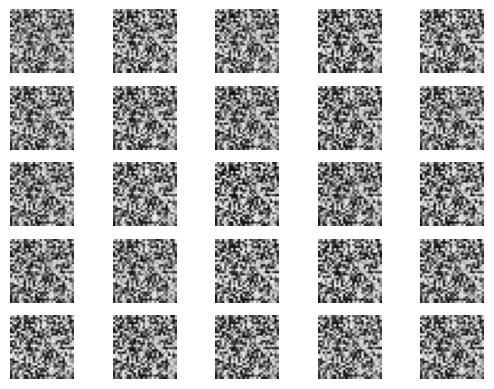

Epoch 60/100 - D Loss: 2.7519, G Loss: 2.7694


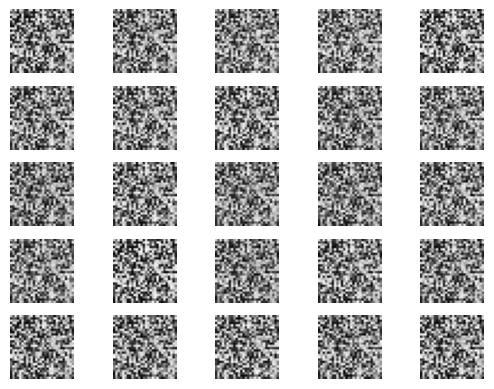

Epoch 70/100 - D Loss: 2.8925, G Loss: 2.9076


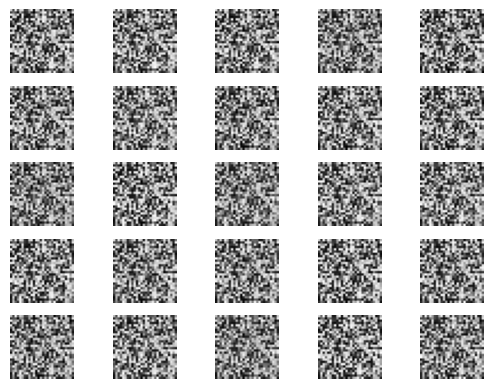

Epoch 80/100 - D Loss: 3.0129, G Loss: 3.0268


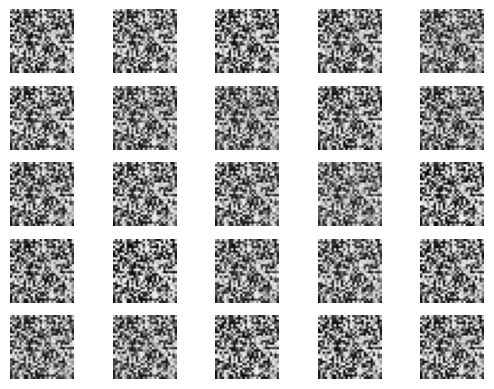

Epoch 90/100 - D Loss: 3.1166, G Loss: 3.1288


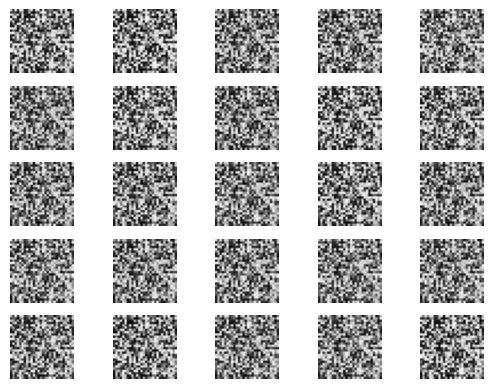

Epoch 100/100 - D Loss: 3.2091, G Loss: 3.2208


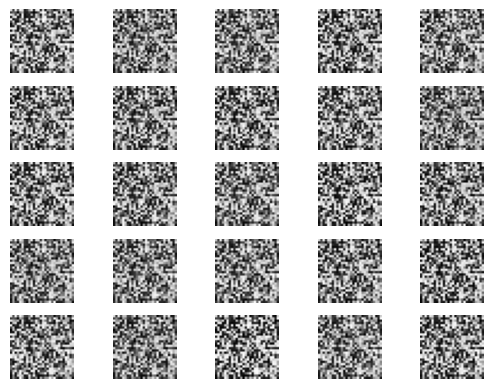

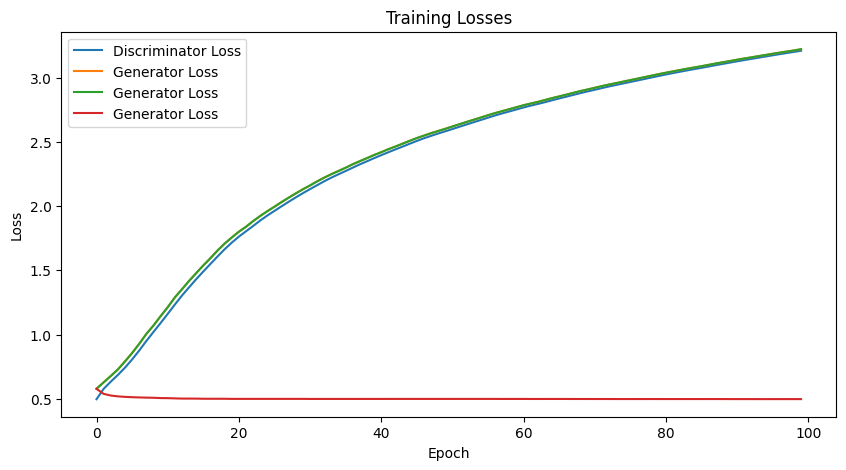

In [41]:
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, LeakyReLU, Flatten, Reshape
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.datasets import mnist

# Load and preprocess the MNIST dataset
(x_train, _), (_, _) = mnist.load_data()
x_train = (x_train.astype(np.float32) - 127.5) / 127.5  # Normalize to range [-1, 1]
x_train = x_train.reshape(x_train.shape[0], -1)  # Flatten the images

# Constants
IMG_SHAPE = (784,)  # Flattened MNIST image shape
LATENT_DIM = 100
BATCH_SIZE = 64
EPOCHS = 100

# Build the generator
def build_generator():
    model = Sequential([
        Dense(256, input_dim=LATENT_DIM),
        LeakyReLU(alpha=0.2),
        Dense(512),
        LeakyReLU(alpha=0.2),
        Dense(1024),
        LeakyReLU(alpha=0.2),
        Dense(np.prod(IMG_SHAPE), activation='tanh')
    ])
    return model

# Build the discriminator
def build_discriminator():
    model = Sequential([
        Dense(1024, input_shape=IMG_SHAPE),
        LeakyReLU(alpha=0.2),
        Dense(512),
        LeakyReLU(alpha=0.2),
        Dense(256),
        LeakyReLU(alpha=0.2),
        Dense(1, activation='sigmoid')
    ])
    return model

# Compile the models
generator = build_generator()
discriminator = build_discriminator()
discriminator.compile(optimizer=Adam(learning_rate=0.0002, beta_1=0.5), loss='binary_crossentropy', metrics=['accuracy'])

def build_gan(generator, discriminator):
    discriminator.trainable = False
    model = Sequential([generator, discriminator])
    model.compile(optimizer=Adam(learning_rate=0.0002, beta_1=0.5), loss='binary_crossentropy')
    return model

gan = build_gan(generator, discriminator)

# Training function
def train():
    d_losses = []
    g_losses = []

    for epoch in range(EPOCHS):
        # Train discriminator
        idx = np.random.randint(0, x_train.shape[0], BATCH_SIZE // 2)
        real_imgs = x_train[idx]

        noise = np.random.normal(0, 1, (BATCH_SIZE // 2, LATENT_DIM))
        fake_imgs = generator.predict(noise, verbose=0)

        real_labels = np.ones((BATCH_SIZE // 2, 1))
        fake_labels = np.zeros((BATCH_SIZE // 2, 1))

        d_loss_real = discriminator.train_on_batch(real_imgs, real_labels)
        d_loss_fake = discriminator.train_on_batch(fake_imgs, fake_labels)
        d_loss = 0.5 * np.add(d_loss_real, d_loss_fake)  # NumPy array

        # Train generator
        noise = np.random.normal(0, 1, (BATCH_SIZE, LATENT_DIM))
        valid_y = np.ones((BATCH_SIZE, 1))
        g_loss = gan.train_on_batch(noise, valid_y)  # Scalar value

        # Append losses
        d_losses.append(d_loss[0])
        g_losses.append(g_loss)

        # Print progress and display images every 1000 epochs
        # Print progress and display images every 1000 epochs
        if (epoch + 1) % 10 == 0:
            print(f"Epoch {(epoch + 1)}/{EPOCHS} - D Loss: {d_loss[0]:.4f}, G Loss: {g_loss[0]:.4f}")
            sample_images(generator)

    return d_losses, g_losses



# Function to generate and display images
def sample_images(generator, n=5):
    noise = np.random.normal(0, 1, (n * n, LATENT_DIM))
    gen_imgs = generator.predict(noise, verbose=0)
    gen_imgs = 0.5 * gen_imgs + 0.5  # Rescale to [0, 1]

    fig, axs = plt.subplots(n, n)
    cnt = 0
    for i in range(n):
        for j in range(n):
            axs[i, j].imshow(gen_imgs[cnt].reshape(28, 28), cmap='gray')
            axs[i, j].axis('off')
            cnt += 1
    plt.show()

# Train the GAN model
d_losses, g_losses = train()

# Plot training losses
plt.figure(figsize=(10, 5))
plt.plot(d_losses, label="Discriminator Loss")
plt.plot(g_losses, label="Generator Loss")
plt.title("Training Losses")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()
plt.show()


Training GAN with Learning Rate: 0.001, Batch Size: 16
Training GAN with Learning Rate: 0.001, Batch Size: 32
Training GAN with Learning Rate: 0.001, Batch Size: 64
Training GAN with Learning Rate: 0.001, Batch Size: 128
Training GAN with Learning Rate: 0.0005, Batch Size: 16
Training GAN with Learning Rate: 0.0005, Batch Size: 32
Training GAN with Learning Rate: 0.0005, Batch Size: 64
Training GAN with Learning Rate: 0.0005, Batch Size: 128
Training GAN with Learning Rate: 0.0002, Batch Size: 16
Training GAN with Learning Rate: 0.0002, Batch Size: 32
Training GAN with Learning Rate: 0.0002, Batch Size: 64
Training GAN with Learning Rate: 0.0002, Batch Size: 128
Training GAN with Learning Rate: 0.0001, Batch Size: 16
Training GAN with Learning Rate: 0.0001, Batch Size: 32
Training GAN with Learning Rate: 0.0001, Batch Size: 64
Training GAN with Learning Rate: 0.0001, Batch Size: 128


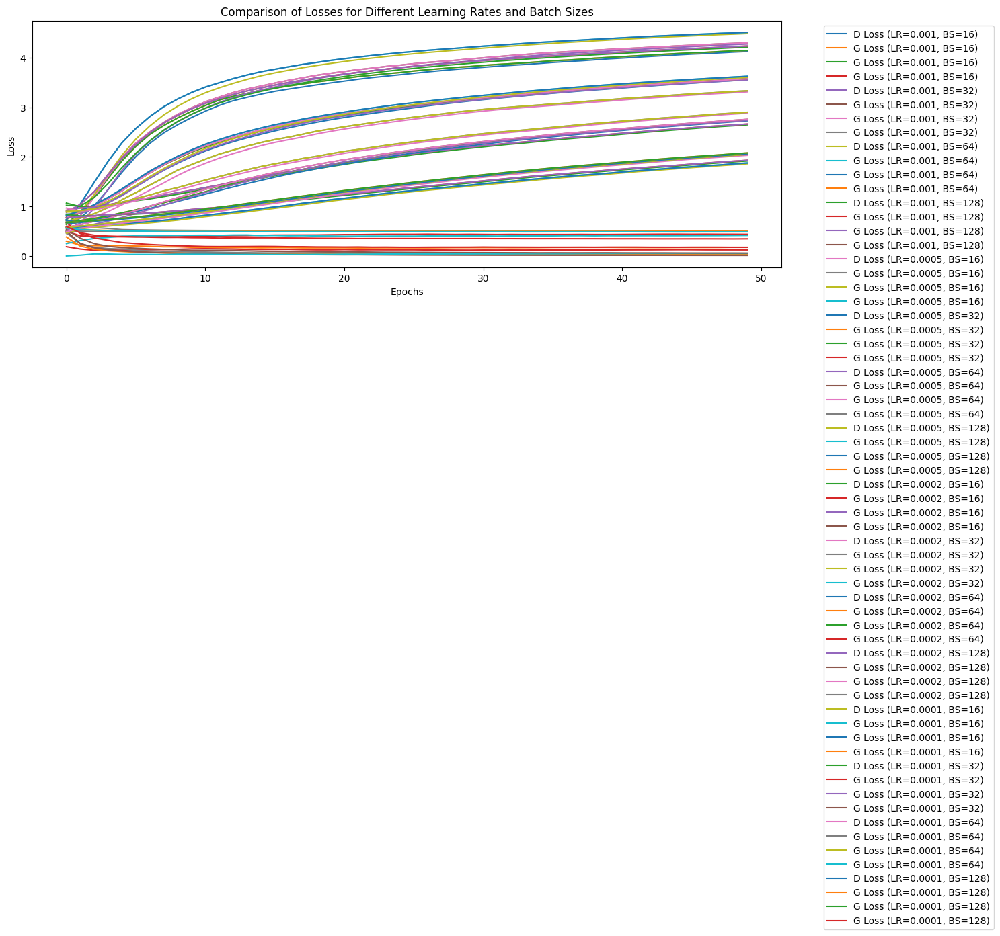

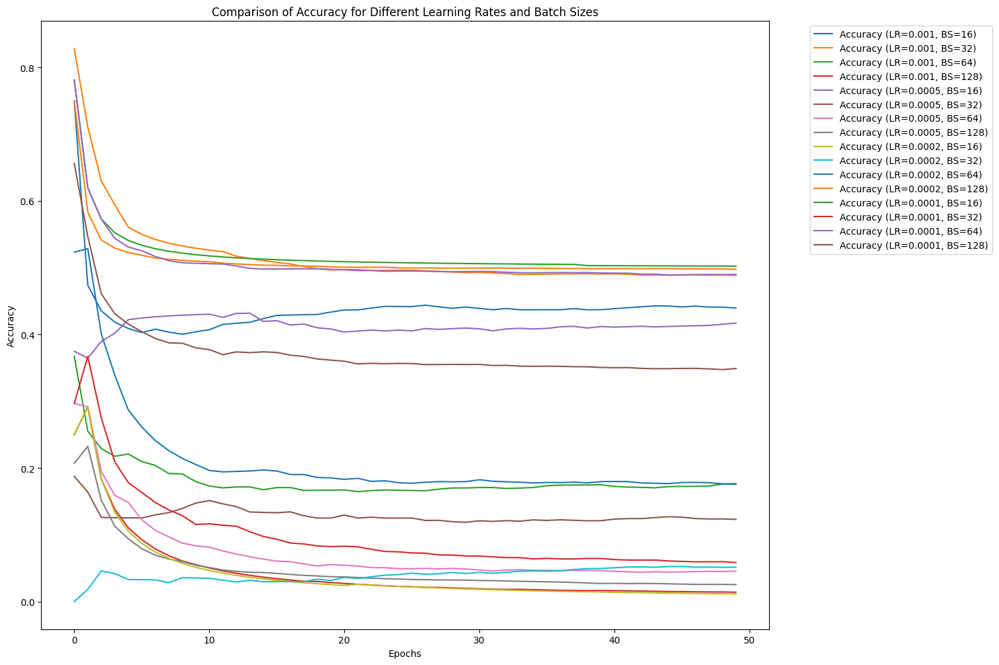

In [43]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, LeakyReLU
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.datasets import mnist

# Load and preprocess the MNIST dataset
(x_train, _), (_, _) = mnist.load_data()
x_train = (x_train.astype(np.float32) - 127.5) / 127.5  # Normalize to range [-1, 1]
x_train = x_train.reshape(x_train.shape[0], -1)  # Flatten the images

# Constants
IMG_SHAPE = (784,)  # Flattened MNIST image shape
LATENT_DIM = 100
EPOCHS = 50  # Use a smaller number for faster experimentation

# Build the generator
def build_generator():
    model = Sequential([
        Dense(256, input_dim=LATENT_DIM),
        LeakyReLU(alpha=0.2),
        Dense(512),
        LeakyReLU(alpha=0.2),
        Dense(1024),
        LeakyReLU(alpha=0.2),
        Dense(np.prod(IMG_SHAPE), activation='tanh')
    ])
    return model

# Build the discriminator
def build_discriminator():
    model = Sequential([
        Dense(1024, input_shape=IMG_SHAPE),
        LeakyReLU(alpha=0.2),
        Dense(512),
        LeakyReLU(alpha=0.2),
        Dense(256),
        LeakyReLU(alpha=0.2),
        Dense(1, activation='sigmoid')
    ])
    return model

# Compile the models
generator = build_generator()
discriminator = build_discriminator()

def build_gan(generator, discriminator):
    discriminator.trainable = False
    model = Sequential([generator, discriminator])
    return model

# Function to train GAN
def train_gan(generator, discriminator, gan, learning_rate, batch_size):
    # Compile discriminator and GAN with the given learning rate
    optimizer = Adam(learning_rate=learning_rate, beta_1=0.5)
    discriminator.compile(optimizer=optimizer, loss='binary_crossentropy', metrics=['accuracy'])
    gan.compile(optimizer=optimizer, loss='binary_crossentropy')
    
    d_losses = []
    g_losses = []
    accuracies = []

    for epoch in range(EPOCHS):
        # Train discriminator
        idx = np.random.randint(0, x_train.shape[0], batch_size // 2)
        real_imgs = x_train[idx]

        noise = np.random.normal(0, 1, (batch_size // 2, LATENT_DIM))
        fake_imgs = generator.predict(noise, verbose=0)

        real_labels = np.ones((batch_size // 2, 1))
        fake_labels = np.zeros((batch_size // 2, 1))

        d_loss_real, d_acc_real = discriminator.train_on_batch(real_imgs, real_labels)
        d_loss_fake, d_acc_fake = discriminator.train_on_batch(fake_imgs, fake_labels)
        d_loss = 0.5 * np.add(d_loss_real, d_loss_fake)  # Average loss
        d_acc = 0.5 * np.add(d_acc_real, d_acc_fake)  # Average accuracy

        # Train generator
        noise = np.random.normal(0, 1, (batch_size, LATENT_DIM))
        valid_y = np.ones((batch_size, 1))
        g_loss = gan.train_on_batch(noise, valid_y)  # Train generator to fool the discriminator

        # Append losses and accuracy
        d_losses.append(d_loss)
        g_losses.append(g_loss)
        accuracies.append(d_acc)

    return d_losses, g_losses, accuracies

# Experiment with different learning rates and batch sizes
learning_rates = [0.001, 0.0005, 0.0002, 0.0001]
batch_sizes = [16, 32, 64, 128]
results = []

for lr in learning_rates:
    for bs in batch_sizes:
        print(f"Training GAN with Learning Rate: {lr}, Batch Size: {bs}")
        generator = build_generator()  # Rebuild generator for each experiment
        discriminator = build_discriminator()  # Rebuild discriminator for each experiment
        gan = build_gan(generator, discriminator)  # Build GAN model
        d_losses, g_losses, accuracies = train_gan(generator, discriminator, gan, lr, bs)
        results.append({'Learning Rate': lr, 'Batch Size': bs, 'Discriminator Loss': d_losses, 'Generator Loss': g_losses, 'Accuracy': accuracies})

# Plot the results for losses
plt.figure(figsize=(15, 10))
for result in results:
    lr = result['Learning Rate']
    bs = result['Batch Size']
    plt.plot(result['Discriminator Loss'], label=f"D Loss (LR={lr}, BS={bs})")
    plt.plot(result['Generator Loss'], label=f"G Loss (LR={lr}, BS={bs})")

plt.title("Comparison of Losses for Different Learning Rates and Batch Sizes")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

# Plot the results for accuracies
plt.figure(figsize=(15, 10))
for result in results:
    lr = result['Learning Rate']
    bs = result['Batch Size']
    plt.plot(result['Accuracy'], label=f"Accuracy (LR={lr}, BS={bs})")

plt.title("Comparison of Accuracy for Different Learning Rates and Batch Sizes")
plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, LeakyReLU
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.datasets import mnist

# Load and preprocess the MNIST dataset
(x_train, _), (_, _) = mnist.load_data()
x_train = (x_train.astype(np.float32) - 127.5) / 127.5  # Normalize to range [-1, 1]
x_train = x_train.reshape(x_train.shape[0], -1)  # Flatten the images

# Constants
IMG_SHAPE = (784,)  # Flattened MNIST image shape
LATENT_DIM = 100
EPOCHS = 50
BATCH_SIZE = 64
LEARNING_RATE = 0.0002

# Build the generator
def build_generator():
    model = Sequential([
        Dense(256, input_dim=LATENT_DIM),
        LeakyReLU(alpha=0.2),
        Dense(512),
        LeakyReLU(alpha=0.2),
        Dense(1024),
        LeakyReLU(alpha=0.2),
        Dense(np.prod(IMG_SHAPE), activation='tanh')
    ])
    return model

# Build the discriminator
def build_discriminator():
    model = Sequential([
        Dense(1024, input_shape=IMG_SHAPE),
        LeakyReLU(alpha=0.2),
        Dense(512),
        LeakyReLU(alpha=0.2),
        Dense(256),
        LeakyReLU(alpha=0.2),
        Dense(1, activation='sigmoid')
    ])
    return model

# Compile the models
generator = build_generator()
discriminator = build_discriminator()

def build_gan(generator, discriminator):
    discriminator.trainable = False
    model = Sequential([generator, discriminator])
    return model

# Training function
def train_gan(generator, discriminator, gan):
    optimizer = Adam(learning_rate=LEARNING_RATE, beta_1=0.5)
    discriminator.compile(optimizer=optimizer, loss='binary_crossentropy', metrics=['accuracy'])
    gan.compile(optimizer=optimizer, loss='binary_crossentropy')
    
    d_losses = []
    g_losses = []
    accuracies = []

    for epoch in range(EPOCHS):
        # Train discriminator
        idx = np.random.randint(0, x_train.shape[0], BATCH_SIZE // 2)
        real_imgs = x_train[idx]

        noise = np.random.normal(0, 1, (BATCH_SIZE // 2, LATENT_DIM))
        fake_imgs = generator.predict(noise, verbose=0)

        real_labels = np.ones((BATCH_SIZE // 2, 1))
        fake_labels = np.zeros((BATCH_SIZE // 2, 1))

        d_loss_real, d_acc_real = discriminator.train_on_batch(real_imgs, real_labels)
        d_loss_fake, d_acc_fake = discriminator.train_on_batch(fake_imgs, fake_labels)
        d_loss = 0.5 * np.add(d_loss_real, d_loss_fake)  # Average loss
        d_acc = 0.5 * np.add(d_acc_real, d_acc_fake)  # Average accuracy

        # Train generator
        noise = np.random.normal(0, 1, (BATCH_SIZE, LATENT_DIM))
        valid_y = np.ones((BATCH_SIZE, 1))
        g_loss = gan.train_on_batch(noise, valid_y)

        # Append losses and accuracy
        d_losses.append(d_loss)
        g_losses.append(g_loss)
        accuracies.append(d_acc)

        if (epoch + 1) % 10 == 0:
            print(f"Epoch {epoch + 1}/{EPOCHS} | D Loss: {d_loss:.4f} | G Loss: {g_loss:.4f} | D Acc: {d_acc:.4f}")

    return d_losses, g_losses, accuracies

# Build and train GAN
gan = build_gan(generator, discriminator)
d_losses, g_losses, accuracies = train_gan(generator, discriminator, gan)

# Plot the results for losses
plt.figure(figsize=(10, 6))
plt.plot(d_losses, label="Discriminator Loss")
plt.plot(g_losses, label="Generator Loss")
plt.title("Losses over Epochs")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.legend()
plt.show()

# Plot the results for accuracy
plt.figure(figsize=(10, 6))
plt.plot(accuracies, label="Discriminator Accuracy")
plt.title("Discriminator Accuracy over Epochs")
plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.legend()
plt.show()


Training GAN with Learning Rate: 0.001, Batch Size: 16
Training GAN with Learning Rate: 0.001, Batch Size: 32
Training GAN with Learning Rate: 0.001, Batch Size: 64
Training GAN with Learning Rate: 0.001, Batch Size: 128
Training GAN with Learning Rate: 0.0005, Batch Size: 16
Training GAN with Learning Rate: 0.0005, Batch Size: 32
Training GAN with Learning Rate: 0.0005, Batch Size: 64
Training GAN with Learning Rate: 0.0005, Batch Size: 128
Training GAN with Learning Rate: 0.0002, Batch Size: 16
Training GAN with Learning Rate: 0.0002, Batch Size: 32
Training GAN with Learning Rate: 0.0002, Batch Size: 64
Training GAN with Learning Rate: 0.0002, Batch Size: 128
Training GAN with Learning Rate: 0.0001, Batch Size: 16
Training GAN with Learning Rate: 0.0001, Batch Size: 32
Training GAN with Learning Rate: 0.0001, Batch Size: 64
Training GAN with Learning Rate: 0.0001, Batch Size: 128


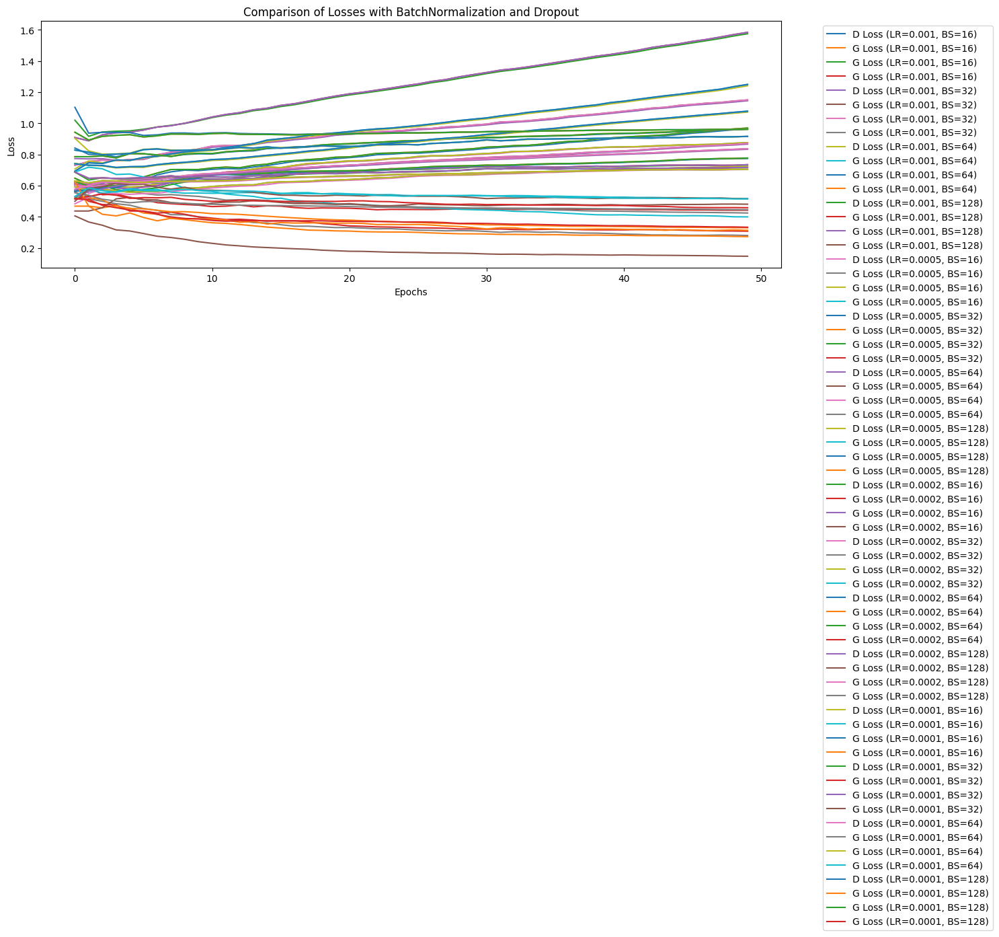

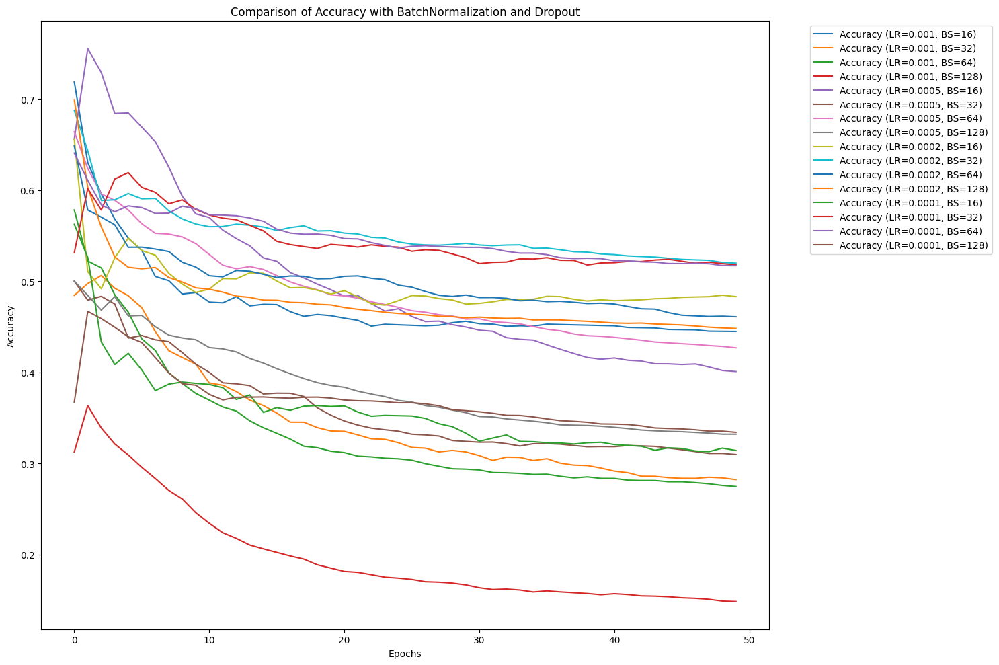

In [44]:
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, LeakyReLU, BatchNormalization, Dropout, Flatten, Reshape
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.datasets import mnist

# Load and preprocess the MNIST dataset
(x_train, _), (_, _) = mnist.load_data()
x_train = (x_train.astype(np.float32) - 127.5) / 127.5  # Normalize to range [-1, 1]
x_train = x_train.reshape(x_train.shape[0], -1)  # Flatten the images

# Constants
IMG_SHAPE = (784,)  # Flattened MNIST image shape
LATENT_DIM = 100
BATCH_SIZE = 64
EPOCHS = 50  # Use a smaller number for faster experimentation

# Build the generator with BatchNormalization and Dropout
def build_generator():
    model = Sequential([
        Dense(256, input_dim=LATENT_DIM),
        LeakyReLU(alpha=0.2),
        BatchNormalization(momentum=0.8),  # Batch Normalization
        Dropout(0.3),  # Dropout to prevent overfitting
        Dense(512),
        LeakyReLU(alpha=0.2),
        BatchNormalization(momentum=0.8),
        Dropout(0.3),
        Dense(1024),
        LeakyReLU(alpha=0.2),
        BatchNormalization(momentum=0.8),
        Dropout(0.3),
        Dense(np.prod(IMG_SHAPE), activation='tanh')
    ])
    return model

# Build the discriminator with BatchNormalization and Dropout
def build_discriminator():
    model = Sequential([
        Dense(1024, input_shape=IMG_SHAPE),
        LeakyReLU(alpha=0.2),
        BatchNormalization(momentum=0.8),
        Dropout(0.3),
        Dense(512),
        LeakyReLU(alpha=0.2),
        BatchNormalization(momentum=0.8),
        Dropout(0.3),
        Dense(256),
        LeakyReLU(alpha=0.2),
        BatchNormalization(momentum=0.8),
        Dropout(0.3),
        Dense(1, activation='sigmoid')
    ])
    return model

# Compile the models
generator = build_generator()
discriminator = build_discriminator()
discriminator.compile(optimizer=Adam(learning_rate=0.0002, beta_1=0.5), loss='binary_crossentropy', metrics=['accuracy'])

def build_gan(generator, discriminator):
    discriminator.trainable = False
    model = Sequential([generator, discriminator])
    model.compile(optimizer=Adam(learning_rate=0.0002, beta_1=0.5), loss='binary_crossentropy')
    return model

gan = build_gan(generator, discriminator)

# Function to train GAN
def train_gan(generator, discriminator, gan, learning_rate, batch_size):
    # Compile discriminator and GAN with the given learning rate
    optimizer = Adam(learning_rate=learning_rate, beta_1=0.5)
    discriminator.compile(optimizer=optimizer, loss='binary_crossentropy', metrics=['accuracy'])
    gan.compile(optimizer=optimizer, loss='binary_crossentropy')
    
    d_losses = []
    g_losses = []
    accuracies = []

    for epoch in range(EPOCHS):
        # Train discriminator
        idx = np.random.randint(0, x_train.shape[0], batch_size // 2)
        real_imgs = x_train[idx]

        noise = np.random.normal(0, 1, (batch_size // 2, LATENT_DIM))
        fake_imgs = generator.predict(noise, verbose=0)

        real_labels = np.ones((batch_size // 2, 1))
        fake_labels = np.zeros((batch_size // 2, 1))

        d_loss_real, d_acc_real = discriminator.train_on_batch(real_imgs, real_labels)
        d_loss_fake, d_acc_fake = discriminator.train_on_batch(fake_imgs, fake_labels)
        d_loss = 0.5 * np.add(d_loss_real, d_loss_fake)  # Average loss
        d_acc = 0.5 * np.add(d_acc_real, d_acc_fake)  # Average accuracy

        # Train generator
        noise = np.random.normal(0, 1, (batch_size, LATENT_DIM))
        valid_y = np.ones((batch_size, 1))
        g_loss = gan.train_on_batch(noise, valid_y)  # Train generator to fool the discriminator

        # Append losses and accuracy
        d_losses.append(d_loss)
        g_losses.append(g_loss)
        accuracies.append(d_acc)

    return d_losses, g_losses, accuracies

# Experiment with different learning rates and batch sizes
learning_rates = [0.001, 0.0005, 0.0002, 0.0001]
batch_sizes = [16, 32, 64, 128]
results = []

for lr in learning_rates:
    for bs in batch_sizes:
        print(f"Training GAN with Learning Rate: {lr}, Batch Size: {bs}")
        generator = build_generator()  # Rebuild generator for each experiment
        discriminator = build_discriminator()  # Rebuild discriminator for each experiment
        gan = build_gan(generator, discriminator)  # Build GAN model
        d_losses, g_losses, accuracies = train_gan(generator, discriminator, gan, lr, bs)
        results.append({'Learning Rate': lr, 'Batch Size': bs, 'Discriminator Loss': d_losses, 'Generator Loss': g_losses, 'Accuracy': accuracies})

# Plot the results for losses
plt.figure(figsize=(15, 10))
for result in results:
    lr = result['Learning Rate']
    bs = result['Batch Size']
    plt.plot(result['Discriminator Loss'], label=f"D Loss (LR={lr}, BS={bs})")
    plt.plot(result['Generator Loss'], label=f"G Loss (LR={lr}, BS={bs})")

plt.title("Comparison of Losses with BatchNormalization and Dropout")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

# Plot the results for accuracies
plt.figure(figsize=(15, 10))
for result in results:
    lr = result['Learning Rate']
    bs = result['Batch Size']
    plt.plot(result['Accuracy'], label=f"Accuracy (LR={lr}, BS={bs})")

plt.title("Comparison of Accuracy with BatchNormalization and Dropout")
plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()


Epoch 100/500
D Loss: 0.8031, G Loss: 0.8039, D Accuracy: 0.2527


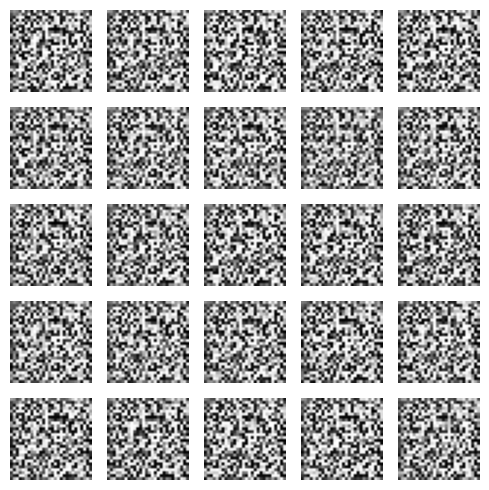

Epoch 200/500
D Loss: 0.8730, G Loss: 0.8735, D Accuracy: 0.2526


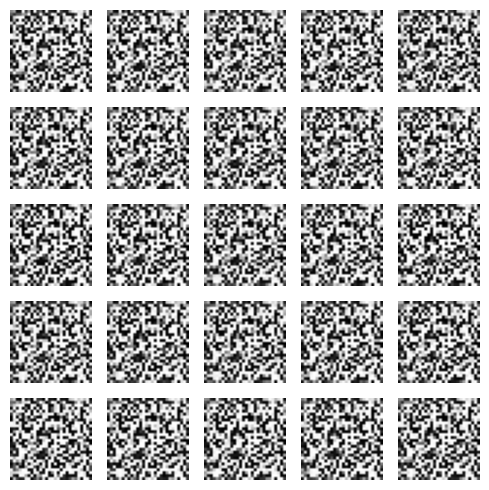

Epoch 300/500
D Loss: 0.9091, G Loss: 0.9094, D Accuracy: 0.2520


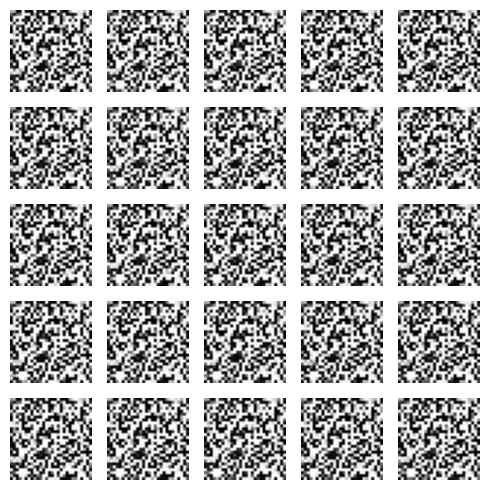

Epoch 400/500
D Loss: 0.9298, G Loss: 0.9301, D Accuracy: 0.2504


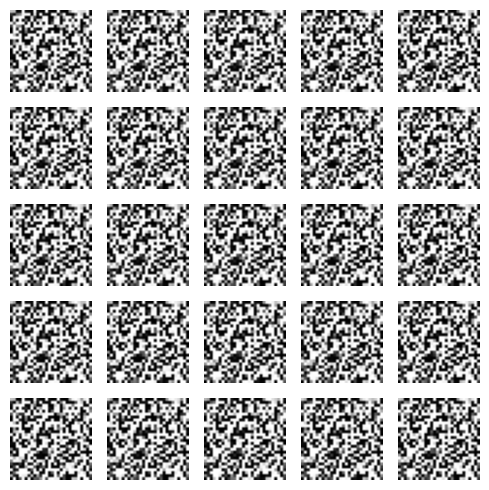

Epoch 500/500
D Loss: 0.9433, G Loss: 0.9435, D Accuracy: 0.2503


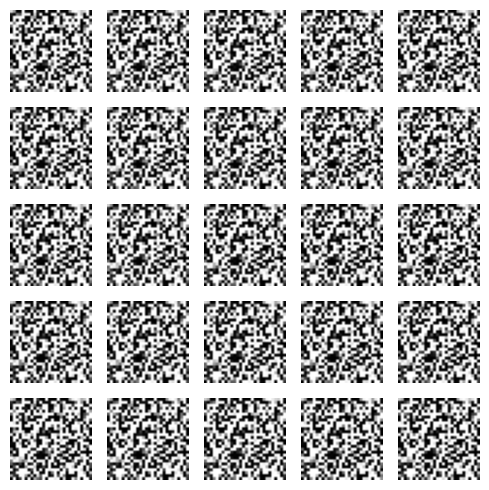

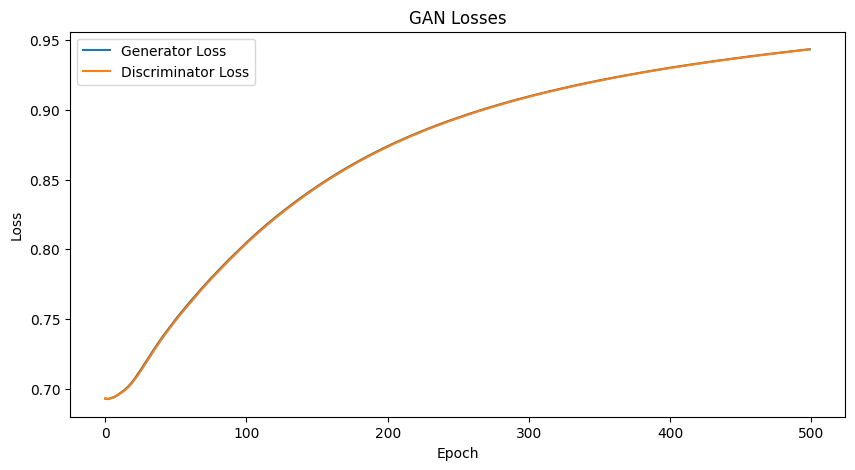

In [21]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Dense, Reshape, Flatten, BatchNormalization, LeakyReLU, Conv2D, Conv2DTranspose, Input
from tensorflow.keras.optimizers import Adam
import matplotlib.pyplot as plt
import os

LATENT_DIM = 100
IMG_SHAPE = (28, 28, 1)
BATCH_SIZE = 64
EPOCHS = 500

def build_generator():
    model = Sequential()
    model.add(Dense(7 * 7 * 256, input_dim=LATENT_DIM))
    model.add(LeakyReLU(alpha=0.2))
    model.add(Reshape((7, 7, 256)))
    model.add(Conv2DTranspose(128, kernel_size=3, strides=2, padding='same'))
    model.add(BatchNormalization(momentum=0.8))
    model.add(LeakyReLU(alpha=0.2))
    model.add(Conv2DTranspose(64, kernel_size=3, strides=1, padding='same'))
    model.add(BatchNormalization(momentum=0.8))
    model.add(LeakyReLU(alpha=0.2))
    model.add(Conv2DTranspose(1, kernel_size=3, strides=2, padding='same', activation='tanh'))
    return model

def build_discriminator():
    model = Sequential()
    model.add(Conv2D(32, kernel_size=3, strides=2, padding='same', input_shape=IMG_SHAPE))
    model.add(LeakyReLU(alpha=0.01))
    model.add(Conv2D(64, kernel_size=3, strides=2, padding='same'))
    model.add(BatchNormalization(momentum=0.8))
    model.add(LeakyReLU(alpha=0.01))
    model.add(Conv2D(128, kernel_size=3, strides=2, padding='same'))
    model.add(BatchNormalization(momentum=0.8))
    model.add(LeakyReLU(alpha=0.01))
    model.add(Flatten())
    model.add(Dense(1, activation='sigmoid'))
    return model

def build_gan(generator, discriminator):
    discriminator.trainable = False
    gan_input = Input(shape=(LATENT_DIM,))
    generated_image = generator(gan_input)
    gan_output = discriminator(generated_image)
    gan = Model(gan_input, gan_output)
    gan.compile(optimizer=Adam(learning_rate=0.0002, beta_1=0.5), loss='binary_crossentropy')
    return gan

generator = build_generator()
discriminator = build_discriminator()
discriminator.compile(optimizer=Adam(learning_rate=0.0002, beta_1=0.5), loss='binary_crossentropy', metrics=['accuracy'])
gan = build_gan(generator, discriminator)

(x_train, _), (_, _) = tf.keras.datasets.mnist.load_data()
x_train = x_train / 127.5 - 1.0
x_train = np.expand_dims(x_train, axis=-1)

if not os.path.exists("images"):
    os.makedirs("images")


def train():
    g_losses = []
    d_losses = []

    for epoch in range(EPOCHS):
        idx = np.random.randint(0, x_train.shape[0], BATCH_SIZE)
        real_imgs = x_train[idx]

        noise = np.random.normal(0, 1, (BATCH_SIZE, LATENT_DIM))
        fake_imgs = generator.predict(noise, verbose=0)

        real_labels = np.ones((BATCH_SIZE, 1))
        fake_labels = np.zeros((BATCH_SIZE, 1))

        d_loss_real = discriminator.train_on_batch(real_imgs, real_labels)
        d_loss_fake = discriminator.train_on_batch(fake_imgs, fake_labels)

        d_loss_real_value = d_loss_real[0] if isinstance(d_loss_real, (list, tuple)) else d_loss_real
        d_loss_fake_value = d_loss_fake[0] if isinstance(d_loss_fake, (list, tuple)) else d_loss_fake
        d_acc_real = d_loss_real[1] if isinstance(d_loss_real, (list, tuple)) and len(d_loss_real) > 1 else 0
        d_acc_fake = d_loss_fake[1] if isinstance(d_loss_fake, (list, tuple)) and len(d_loss_fake) > 1 else 0

        d_loss = 0.5 * (d_loss_real_value + d_loss_fake_value)
        d_acc = 0.5 * (d_acc_real + d_acc_fake)

        noise = np.random.normal(0, 1, (BATCH_SIZE, LATENT_DIM))
        valid_y = np.ones((BATCH_SIZE, 1))
        g_loss = gan.train_on_batch(noise, valid_y)

        g_losses.append(g_loss if not isinstance(g_loss, (list, tuple)) else g_loss[0])
        d_losses.append(d_loss)

        if (epoch + 1) % 100 == 0:
            print(f"Epoch {epoch + 1}/{EPOCHS}")
            print(f"D Loss: {d_loss:.4f}, G Loss: {g_losses[-1]:.4f}, D Accuracy: {d_acc:.4f}")
            sample_images(generator, epoch + 1, show=True)

    plot_losses(g_losses, d_losses)

def sample_images(generator, epoch, n=5, show=False):
    noise = np.random.normal(0, 1, (n * n, LATENT_DIM))
    gen_imgs = generator.predict(noise, verbose=0)
    gen_imgs = 0.5 * gen_imgs + 0.5
    fig, axs = plt.subplots(n, n, figsize=(n, n))
    cnt = 0
    for i in range(n):
        for j in range(n):
            axs[i, j].imshow(gen_imgs[cnt, :, :, 0], cmap='gray')
            axs[i, j].axis('off')
            cnt += 1
    plt.tight_layout()
    plt.savefig(f"images/mnist_{epoch}.png")
    if show:
        plt.show()
    plt.close()


train()



Epoch 100/500
D Loss: 0.7977, G Loss: 0.7983, D Accuracy: 0.0513


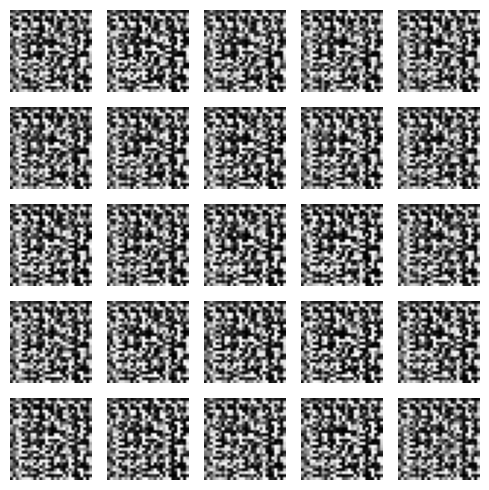

Epoch 200/500
D Loss: 0.8636, G Loss: 0.8640, D Accuracy: 0.0273


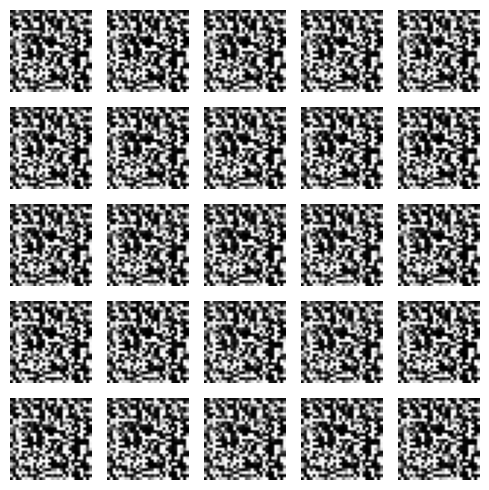

Epoch 300/500
D Loss: 0.8978, G Loss: 0.8980, D Accuracy: 0.0195


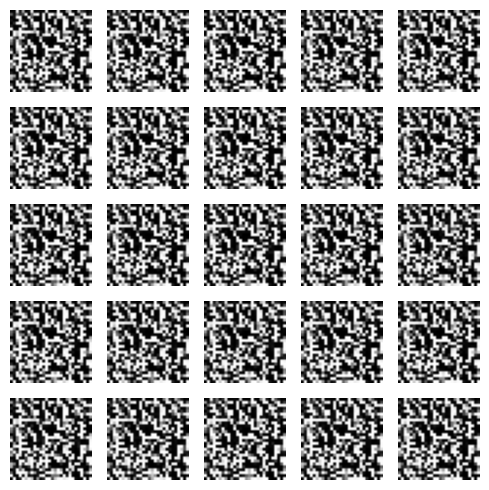

Epoch 400/500
D Loss: 0.9174, G Loss: 0.9176, D Accuracy: 0.0155


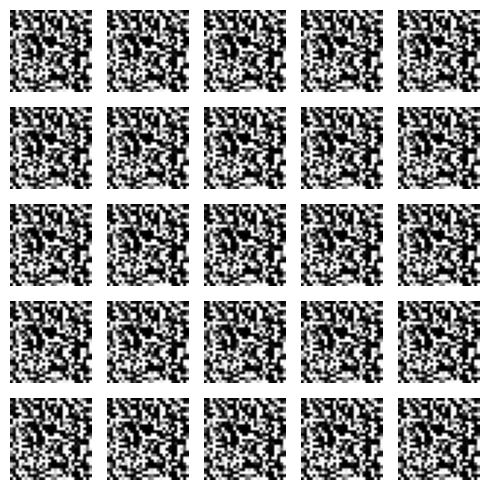

Epoch 500/500
D Loss: 0.9304, G Loss: 0.9305, D Accuracy: 0.0129


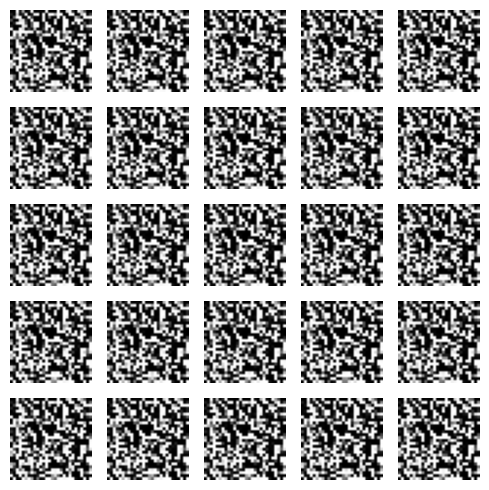

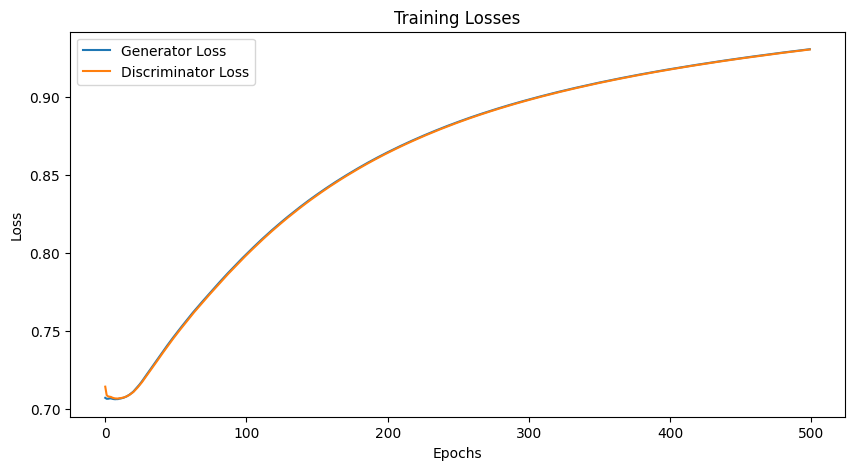

In [24]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Dense, Reshape, Flatten, BatchNormalization, LeakyReLU,ReLU, Conv2D, Conv2DTranspose, Input
from tensorflow.keras.optimizers import Adam
import matplotlib.pyplot as plt
import os

LATENT_DIM = 100
IMG_SHAPE = (28, 28, 1)
BATCH_SIZE = 64
EPOCHS = 500

def build_generator():
    model = Sequential()
    model.add(Dense(7 * 7 * 256, input_dim=LATENT_DIM))
    model.add(ReLU())
    model.add(Reshape((7, 7, 256)))
    model.add(Conv2DTranspose(128, kernel_size=3, strides=2, padding='same'))
    model.add(BatchNormalization(momentum=0.8))
    model.add(ReLU())
    model.add(Conv2DTranspose(64, kernel_size=3, strides=1, padding='same'))
    model.add(BatchNormalization(momentum=0.8))
    model.add(ReLU())
    model.add(Conv2DTranspose(1, kernel_size=3, strides=2, padding='same', activation='tanh'))
    return model

def build_discriminator():
    model = Sequential()
    model.add(Conv2D(32, kernel_size=3, strides=2, padding='same', input_shape=IMG_SHAPE))
    model.add(LeakyReLU(alpha=0.01))
    model.add(Conv2D(64, kernel_size=3, strides=2, padding='same'))
    model.add(BatchNormalization(momentum=0.8))
    model.add(LeakyReLU(alpha=0.01))
    model.add(Conv2D(128, kernel_size=3, strides=2, padding='same'))
    model.add(BatchNormalization(momentum=0.8))
    model.add(LeakyReLU(alpha=0.01))
    model.add(Flatten())
    model.add(Dense(1, activation='sigmoid'))
    return model

def build_gan(generator, discriminator):
    discriminator.trainable = False
    gan_input = Input(shape=(LATENT_DIM,))
    generated_image = generator(gan_input)
    gan_output = discriminator(generated_image)
    gan = Model(gan_input, gan_output)
    gan.compile(optimizer=Adam(learning_rate=0.0002, beta_1=0.5), loss='binary_crossentropy')
    return gan

generator = build_generator()
discriminator = build_discriminator()
discriminator.compile(optimizer=Adam(learning_rate=0.0002, beta_1=0.5), loss='binary_crossentropy', metrics=['accuracy'])
gan = build_gan(generator, discriminator)

(x_train, _), (_, _) = tf.keras.datasets.mnist.load_data()
x_train = x_train / 127.5 - 1.0
x_train = np.expand_dims(x_train, axis=-1)

if not os.path.exists("images"):
    os.makedirs("images")


def train():
    g_losses = []
    d_losses = []

    for epoch in range(EPOCHS):
        idx = np.random.randint(0, x_train.shape[0], BATCH_SIZE)
        real_imgs = x_train[idx]

        noise = np.random.normal(0, 1, (BATCH_SIZE, LATENT_DIM))
        fake_imgs = generator.predict(noise, verbose=0)

        real_labels = np.ones((BATCH_SIZE, 1))
        fake_labels = np.zeros((BATCH_SIZE, 1))

        d_loss_real = discriminator.train_on_batch(real_imgs, real_labels)
        d_loss_fake = discriminator.train_on_batch(fake_imgs, fake_labels)

        d_loss_real_value = d_loss_real[0] if isinstance(d_loss_real, (list, tuple)) else d_loss_real
        d_loss_fake_value = d_loss_fake[0] if isinstance(d_loss_fake, (list, tuple)) else d_loss_fake
        d_acc_real = d_loss_real[1] if isinstance(d_loss_real, (list, tuple)) and len(d_loss_real) > 1 else 0
        d_acc_fake = d_loss_fake[1] if isinstance(d_loss_fake, (list, tuple)) and len(d_loss_fake) > 1 else 0

        d_loss = 0.5 * (d_loss_real_value + d_loss_fake_value)
        d_acc = 0.5 * (d_acc_real + d_acc_fake)

        noise = np.random.normal(0, 1, (BATCH_SIZE, LATENT_DIM))
        valid_y = np.ones((BATCH_SIZE, 1))
        g_loss = gan.train_on_batch(noise, valid_y)
        g_loss_value = g_loss[0] if isinstance(g_loss, (list, tuple)) else g_loss

        g_losses.append(g_loss_value)
        d_losses.append(d_loss)

        if (epoch + 1) % 100 == 0:
            print(f"Epoch {epoch + 1}/{EPOCHS}")
            print(f"D Loss: {d_loss:.4f}, G Loss: {g_loss_value:.4f}, D Accuracy: {d_acc:.4f}")
            sample_images(generator, epoch + 1, show=True)

    plot_losses(g_losses, d_losses)


def sample_images(generator, epoch, n=5, show=False):
    noise = np.random.normal(0, 1, (n * n, LATENT_DIM))
    gen_imgs = generator.predict(noise, verbose=0)
    gen_imgs = 0.5 * gen_imgs + 0.5
    fig, axs = plt.subplots(n, n, figsize=(n, n))
    cnt = 0
    for i in range(n):
        for j in range(n):
            axs[i, j].imshow(gen_imgs[cnt, :, :, 0], cmap='gray')
            axs[i, j].axis('off')
            cnt += 1
    plt.tight_layout()
    plt.savefig(f"images/mnist_{epoch}.png")
    if show:
        plt.show()
    plt.close()


def plot_losses(g_losses, d_losses):
    plt.figure(figsize=(10, 5))
    plt.plot(g_losses, label='Generator Loss')
    plt.plot(d_losses, label='Discriminator Loss')
    plt.title("Training Losses")
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    plt.legend()
    plt.savefig("images/losses.png")
    plt.show()


train()


In [3]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Dense, Reshape, Flatten, BatchNormalization, LeakyReLU, ReLU, Conv2D, Conv2DTranspose, Input
from tensorflow.keras.optimizers import Adam
import matplotlib.pyplot as plt
import os

LATENT_DIM = 100
IMG_SHAPE = (28, 28, 1)
EPOCHS = 500

def build_generator():
    model = Sequential()
    model.add(Dense(7 * 7 * 256, input_dim=LATENT_DIM))
    model.add(ReLU())
    model.add(Reshape((7, 7, 256)))
    model.add(Conv2DTranspose(128, kernel_size=3, strides=2, padding='same'))
    model.add(BatchNormalization(momentum=0.8))
    model.add(ReLU())
    model.add(Conv2DTranspose(64, kernel_size=3, strides=1, padding='same'))
    model.add(BatchNormalization(momentum=0.8))
    model.add(ReLU())
    model.add(Conv2DTranspose(1, kernel_size=3, strides=2, padding='same', activation='tanh'))
    return model

def build_discriminator():
    model = Sequential()
    model.add(Conv2D(32, kernel_size=3, strides=2, padding='same', input_shape=IMG_SHAPE))
    model.add(LeakyReLU(alpha=0.01))
    model.add(Conv2D(64, kernel_size=3, strides=2, padding='same'))
    model.add(BatchNormalization(momentum=0.8))
    model.add(LeakyReLU(alpha=0.01))
    model.add(Conv2D(128, kernel_size=3, strides=2, padding='same'))
    model.add(BatchNormalization(momentum=0.8))
    model.add(LeakyReLU(alpha=0.01))
    model.add(Flatten())
    model.add(Dense(1, activation='sigmoid'))
    return model

def build_gan(generator, discriminator):
    discriminator.trainable = False
    gan_input = Input(shape=(LATENT_DIM,))
    generated_image = generator(gan_input)
    gan_output = discriminator(generated_image)
    gan = Model(gan_input, gan_output)
    gan.compile(optimizer=Adam(learning_rate=0.0002, beta_1=0.5), loss='binary_crossentropy')
    return gan

learning_rates = [0.0001, 0.0002, 0.001, 0.005]
batch_sizes = [32, 64, 128]

def train_with_hyperparameters(lr, batch_size):
    generator = build_generator()
    discriminator = build_discriminator()
    discriminator.compile(optimizer=Adam(learning_rate=lr, beta_1=0.5), loss='binary_crossentropy', metrics=['accuracy'])
    gan = build_gan(generator, discriminator)
    
    (x_train, _), (_, _) = tf.keras.datasets.mnist.load_data()
    x_train = x_train / 127.5 - 1.0
    x_train = np.expand_dims(x_train, axis=-1)

    if not os.path.exists("images"):
        os.makedirs("images")
        
    g_losses = []
    d_losses = []
    d_accs = []
    
    for epoch in range(EPOCHS):
        idx = np.random.randint(0, x_train.shape[0], batch_size)
        real_imgs = x_train[idx]
        
        noise = np.random.normal(0, 1, (batch_size, LATENT_DIM))
        fake_imgs = generator.predict(noise, verbose=0)
        
        real_labels = np.ones((batch_size, 1))
        fake_labels = np.zeros((batch_size, 1))
        
        d_loss_real = discriminator.train_on_batch(real_imgs, real_labels)
        d_loss_fake = discriminator.train_on_batch(fake_imgs, fake_labels)
        
        d_loss = 0.5 * (d_loss_real[0] + d_loss_fake[0])
        d_acc = 0.5 * (d_loss_real[1] + d_loss_fake[1])
        
        noise = np.random.normal(0, 1, (batch_size, LATENT_DIM))
        valid_y = np.ones((batch_size, 1))
        g_loss = gan.train_on_batch(noise, valid_y)
        
        g_losses.append(g_loss[0])
        d_losses.append(d_loss)
        d_accs.append(d_acc)
        
        if (epoch + 1) % 100 == 0:
            print(f"LR={lr}, Batch Size={batch_size}, Epoch {epoch + 1}/{EPOCHS}")
            print(f"D Loss: {d_loss:.4f}, G Loss: {g_loss[0]:.4f}, D Accuracy: {d_acc:.4f}")
            sample_images(generator, epoch + 1, show=False)
    
    return g_losses, d_losses, d_accs

def sample_images(generator, epoch, n=5, show=False):
    noise = np.random.normal(0, 1, (n * n, LATENT_DIM))
    gen_imgs = generator.predict(noise, verbose=0)
    gen_imgs = 0.5 * gen_imgs + 0.5
    fig, axs = plt.subplots(n, n, figsize=(n, n))
    cnt = 0
    for i in range(n):
        for j in range(n):
            axs[i, j].imshow(gen_imgs[cnt, :, :, 0], cmap='gray')
            axs[i, j].axis('off')
            cnt += 1
    plt.tight_layout()
    plt.savefig(f"images/mnist_{epoch}.png")
    if show:
        plt.show()
    plt.close()

results = {}
for lr in learning_rates:
    for batch_size in batch_sizes:
        g_losses, d_losses, d_accs = train_with_hyperparameters(lr, batch_size)
        results[(lr, batch_size)] = (g_losses, d_losses, d_accs)

def plot_comparison(results):
    plt.figure(figsize=(10, 5))
    for (lr, batch_size), (g_losses, d_losses, d_accs) in results.items():
        plt.plot(g_losses, label=f"Generator Loss (LR={lr}, BS={batch_size})")
        plt.plot(d_losses, label=f"Discriminator Loss (LR={lr}, BS={batch_size})")
    plt.title("Generator and Discriminator Losses")
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    plt.legend()
    plt.savefig("images/comparison_losses.png")
    plt.show()



/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/usr/local/lib/python3.10/dist-packages/keras/src/layers/activations/leaky_relu.py:41: UserWarning: Argument `alpha` is deprecated. Use `negative_slope` instead.
  warnings.warn(


11490434/11490434 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step


/usr/local/lib/python3.10/dist-packages/keras/src/backend/tensorflow/trainer.py:75: UserWarning: The model does not have any trainable weights.
  warnings.warn("The model does not have any trainable weights.")


LR=0.0001, Batch Size=32, Epoch 100/500
D Loss: 0.7846, G Loss: 0.7852, D Accuracy: 0.3025
LR=0.0001, Batch Size=32, Epoch 200/500
D Loss: 0.8468, G Loss: 0.8472, D Accuracy: 0.3022
LR=0.0001, Batch Size=32, Epoch 300/500
D Loss: 0.8823, G Loss: 0.8826, D Accuracy: 0.3054
LR=0.0001, Batch Size=32, Epoch 400/500
D Loss: 0.9045, G Loss: 0.9047, D Accuracy: 0.3065
LR=0.0001, Batch Size=32, Epoch 500/500
D Loss: 0.9197, G Loss: 0.9198, D Accuracy: 0.3066
LR=0.0001, Batch Size=64, Epoch 100/500
D Loss: 0.8035, G Loss: 0.8041, D Accuracy: 0.0197
LR=0.0001, Batch Size=64, Epoch 200/500
D Loss: 0.8626, G Loss: 0.8630, D Accuracy: 0.0161
LR=0.0001, Batch Size=64, Epoch 300/500
D Loss: 0.8953, G Loss: 0.8956, D Accuracy: 0.0159
LR=0.0001, Batch Size=64, Epoch 400/500
D Loss: 0.9155, G Loss: 0.9157, D Accuracy: 0.0157
LR=0.0001, Batch Size=64, Epoch 500/500
D Loss: 0.9291, G Loss: 0.9293, D Accuracy: 0.0156
LR=0.0001, Batch Size=128, Epoch 100/500
D Loss: 0.8082, G Loss: 0.8088, D Accuracy: 0.011

LR=0.0001, Batch Size=32, Epoch 20/100
D Loss: 0.6967, G Loss: 0.6971, D Accuracy: 0.3395
LR=0.0001, Batch Size=32, Epoch 40/100
D Loss: 0.7161, G Loss: 0.7167, D Accuracy: 0.3164
LR=0.0001, Batch Size=32, Epoch 60/100
D Loss: 0.7330, G Loss: 0.7336, D Accuracy: 0.3120
LR=0.0001, Batch Size=32, Epoch 80/100
D Loss: 0.7482, G Loss: 0.7488, D Accuracy: 0.3076
LR=0.0001, Batch Size=32, Epoch 100/100
D Loss: 0.7625, G Loss: 0.7630, D Accuracy: 0.3033
LR=0.0001, Batch Size=64, Epoch 20/100
D Loss: 0.6991, G Loss: 0.6998, D Accuracy: 0.3489
LR=0.0001, Batch Size=64, Epoch 40/100
D Loss: 0.7308, G Loss: 0.7318, D Accuracy: 0.3302
LR=0.0001, Batch Size=64, Epoch 60/100
D Loss: 0.7597, G Loss: 0.7606, D Accuracy: 0.3279
LR=0.0001, Batch Size=64, Epoch 80/100
D Loss: 0.7829, G Loss: 0.7837, D Accuracy: 0.3261
LR=0.0001, Batch Size=64, Epoch 100/100
D Loss: 0.8019, G Loss: 0.8026, D Accuracy: 0.3257
LR=0.0001, Batch Size=128, Epoch 20/100
D Loss: 0.7014, G Loss: 0.7020, D Accuracy: 0.3173
LR=0.00

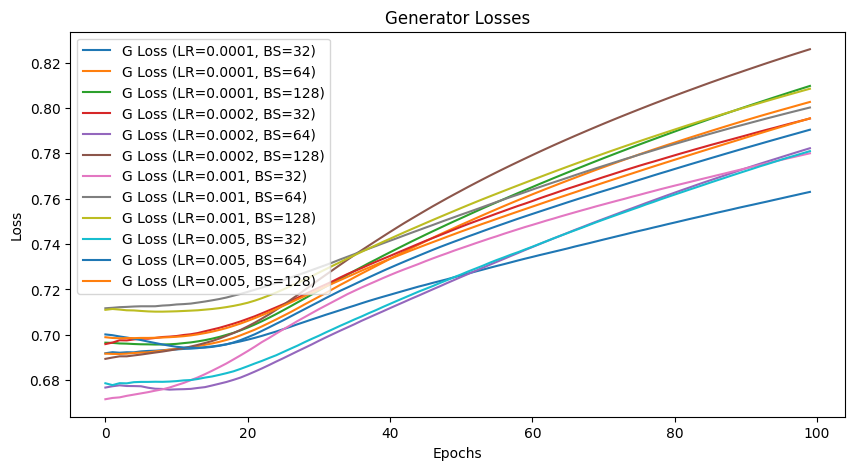

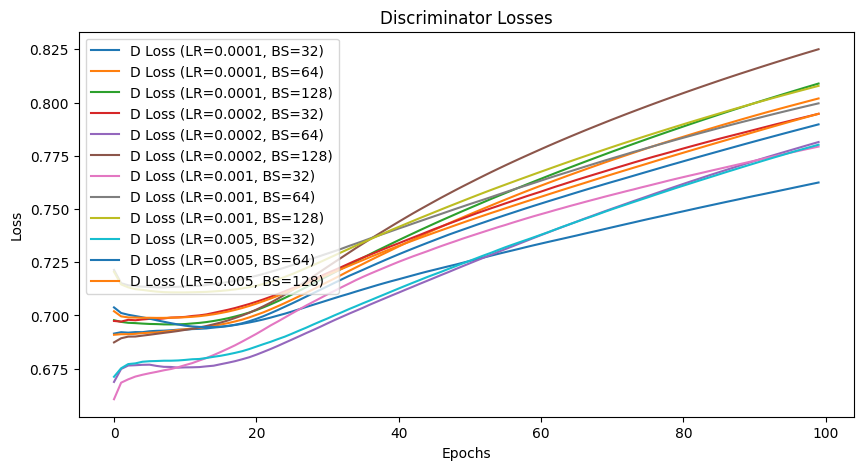

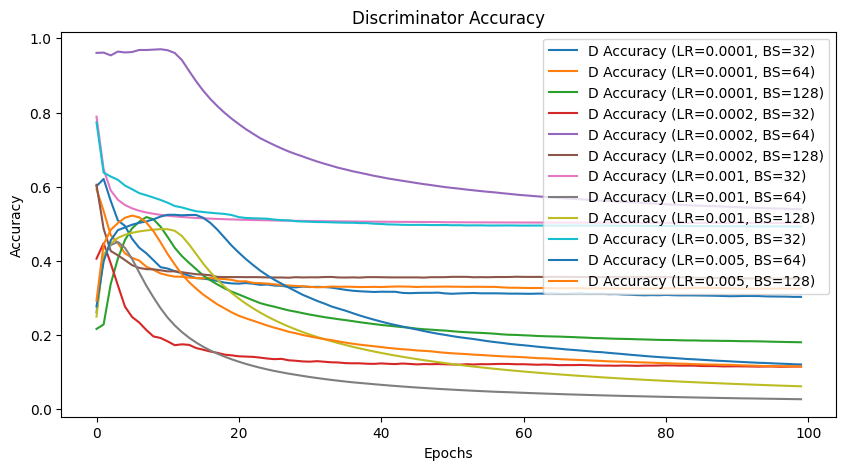

In [26]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Dense, Reshape, Flatten, BatchNormalization, LeakyReLU, ReLU, Conv2D, Conv2DTranspose, Input
from tensorflow.keras.optimizers import Adam
import matplotlib.pyplot as plt
import os

LATENT_DIM = 100
IMG_SHAPE = (28, 28, 1)
EPOCHS = 100

def build_generator():
    model = Sequential()
    model.add(Dense(7 * 7 * 256, input_dim=LATENT_DIM))
    model.add(ReLU())
    model.add(Reshape((7, 7, 256)))
    model.add(Conv2DTranspose(128, kernel_size=3, strides=2, padding='same'))
    model.add(BatchNormalization(momentum=0.8))
    model.add(ReLU())
    model.add(Conv2DTranspose(64, kernel_size=3, strides=1, padding='same'))
    model.add(BatchNormalization(momentum=0.8))
    model.add(ReLU())
    model.add(Conv2DTranspose(1, kernel_size=3, strides=2, padding='same', activation='tanh'))
    return model

def build_discriminator():
    model = Sequential()
    model.add(Conv2D(32, kernel_size=3, strides=2, padding='same', input_shape=IMG_SHAPE))
    model.add(LeakyReLU(alpha=0.01))
    model.add(Conv2D(64, kernel_size=3, strides=2, padding='same'))
    model.add(BatchNormalization(momentum=0.8))
    model.add(LeakyReLU(alpha=0.01))
    model.add(Conv2D(128, kernel_size=3, strides=2, padding='same'))
    model.add(BatchNormalization(momentum=0.8))
    model.add(LeakyReLU(alpha=0.01))
    model.add(Flatten())
    model.add(Dense(1, activation='sigmoid'))
    return model

def build_gan(generator, discriminator):
    discriminator.trainable = False
    gan_input = Input(shape=(LATENT_DIM,))
    generated_image = generator(gan_input)
    gan_output = discriminator(generated_image)
    gan = Model(gan_input, gan_output)
    gan.compile(optimizer=Adam(learning_rate=0.0002, beta_1=0.5), loss='binary_crossentropy')
    return gan

learning_rates = [0.0001, 0.0002, 0.001, 0.005]
batch_sizes = [32, 64, 128]

def train_with_hyperparameters(lr, batch_size):
    generator = build_generator()
    discriminator = build_discriminator()
    discriminator.compile(optimizer=Adam(learning_rate=lr, beta_1=0.5), loss='binary_crossentropy', metrics=['accuracy'])
    gan = build_gan(generator, discriminator)
    
    (x_train, _), (_, _) = tf.keras.datasets.mnist.load_data()
    x_train = x_train / 127.5 - 1.0
    x_train = np.expand_dims(x_train, axis=-1)

    if not os.path.exists("images"):
        os.makedirs("images")
        
    g_losses = []
    d_losses = []
    d_accs = []
    
    for epoch in range(EPOCHS):
        idx = np.random.randint(0, x_train.shape[0], batch_size)
        real_imgs = x_train[idx]
        
        noise = np.random.normal(0, 1, (batch_size, LATENT_DIM))
        fake_imgs = generator.predict(noise, verbose=0)
        
        real_labels = np.ones((batch_size, 1))
        fake_labels = np.zeros((batch_size, 1))
        
        d_loss_real = discriminator.train_on_batch(real_imgs, real_labels)
        d_loss_fake = discriminator.train_on_batch(fake_imgs, fake_labels)
        
        d_loss = 0.5 * (d_loss_real[0] + d_loss_fake[0])
        d_acc = 0.5 * (d_loss_real[1] + d_loss_fake[1])
        
        noise = np.random.normal(0, 1, (batch_size, LATENT_DIM))
        valid_y = np.ones((batch_size, 1))
        g_loss = gan.train_on_batch(noise, valid_y)
        
        g_losses.append(g_loss[0])
        d_losses.append(d_loss)
        d_accs.append(d_acc)
        
        if (epoch + 1) % 20 == 0:
            print(f"LR={lr}, Batch Size={batch_size}, Epoch {epoch + 1}/{EPOCHS}")
            print(f"D Loss: {d_loss:.4f}, G Loss: {g_loss[0]:.4f}, D Accuracy: {d_acc:.4f}")
            sample_images(generator, epoch + 1, show=False)
    
    return g_losses, d_losses, d_accs

def sample_images(generator, epoch, n=5, show=False):
    noise = np.random.normal(0, 1, (n * n, LATENT_DIM))
    gen_imgs = generator.predict(noise, verbose=0)
    gen_imgs = 0.5 * gen_imgs + 0.5
    fig, axs = plt.subplots(n, n, figsize=(n, n))
    cnt = 0
    for i in range(n):
        for j in range(n):
            axs[i, j].imshow(gen_imgs[cnt, :, :, 0], cmap='gray')
            axs[i, j].axis('off')
            cnt += 1
    plt.tight_layout()
    plt.savefig(f"images/mnist_{epoch}.png")
    if show:
        plt.show()
    plt.close()

results = {}
for lr in learning_rates:
    for batch_size in batch_sizes:
        g_losses, d_losses, d_accs = train_with_hyperparameters(lr, batch_size)
        results[(lr, batch_size)] = (g_losses, d_losses, d_accs)

def plot_comparison(results):
    # Plot Generator Loss separately
    plt.figure(figsize=(10, 5))
    for (lr, batch_size), (g_losses, _, _) in results.items():
        plt.plot(g_losses, label=f"G Loss (LR={lr}, BS={batch_size})")
    plt.title("Generator Losses")
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    plt.legend()
    plt.savefig("images/generator_losses.png")
    plt.show()

    # Plot Discriminator Loss separately
    plt.figure(figsize=(10, 5))
    for (lr, batch_size), (_, d_losses, _) in results.items():
        plt.plot(d_losses, label=f"D Loss (LR={lr}, BS={batch_size})")
    plt.title("Discriminator Losses")
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    plt.legend()
    plt.savefig("images/discriminator_losses.png")
    plt.show()

    # Plot Discriminator Accuracy separately
    plt.figure(figsize=(10, 5))
    for (lr, batch_size), (_, _, d_accs) in results.items():
        plt.plot(d_accs, label=f"D Accuracy (LR={lr}, BS={batch_size})")
    plt.title("Discriminator Accuracy")
    plt.xlabel("Epochs")
    plt.ylabel("Accuracy")
    plt.legend()
    plt.savefig("images/discriminator_accuracy.png")
    plt.show()


plot_comparison(results)

LR=0.0001, Batch Size=32, Epoch 20/100
D Loss: 0.6927, G Loss: 0.6931, D Accuracy: 0.3869
LR=0.0001, Batch Size=32, Epoch 40/100
D Loss: 0.7041, G Loss: 0.7045, D Accuracy: 0.3467
LR=0.0001, Batch Size=32, Epoch 60/100
D Loss: 0.7134, G Loss: 0.7137, D Accuracy: 0.3353
LR=0.0001, Batch Size=32, Epoch 80/100
D Loss: 0.7216, G Loss: 0.7219, D Accuracy: 0.3301
LR=0.0001, Batch Size=32, Epoch 100/100
D Loss: 0.7298, G Loss: 0.7301, D Accuracy: 0.3313
LR=0.0001, Batch Size=64, Epoch 20/100
D Loss: 0.7046, G Loss: 0.7048, D Accuracy: 0.3248
LR=0.0001, Batch Size=64, Epoch 40/100
D Loss: 0.7203, G Loss: 0.7207, D Accuracy: 0.2579
LR=0.0001, Batch Size=64, Epoch 60/100
D Loss: 0.7327, G Loss: 0.7331, D Accuracy: 0.2331
LR=0.0001, Batch Size=64, Epoch 80/100
D Loss: 0.7440, G Loss: 0.7444, D Accuracy: 0.2201
LR=0.0001, Batch Size=64, Epoch 100/100
D Loss: 0.7549, G Loss: 0.7553, D Accuracy: 0.2136
LR=0.0001, Batch Size=128, Epoch 20/100
D Loss: 0.7367, G Loss: 0.7363, D Accuracy: 0.2559
LR=0.00

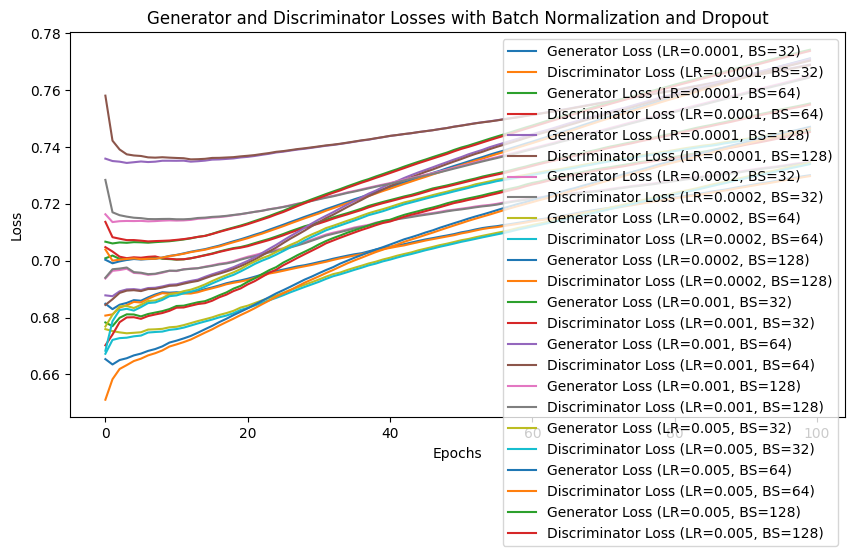

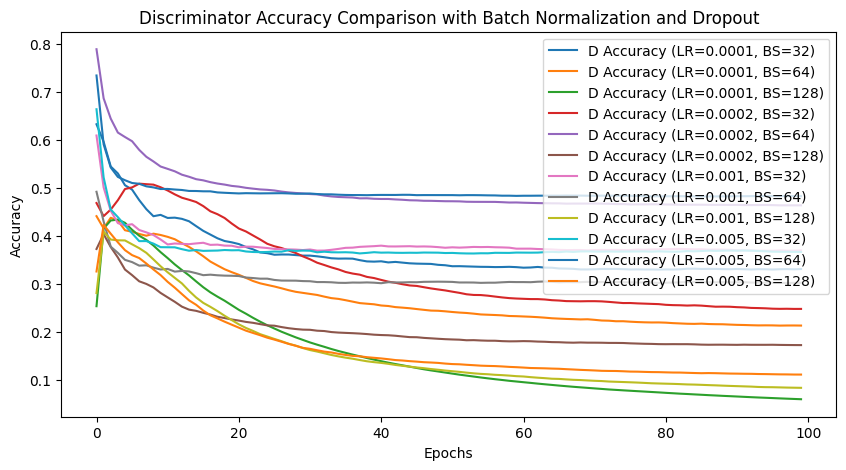

In [19]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Dense, Reshape, Flatten, BatchNormalization, Dropout, LeakyReLU, Conv2D, Conv2DTranspose, Input
from tensorflow.keras.optimizers import Adam
import matplotlib.pyplot as plt
import os

LATENT_DIM = 100
IMG_SHAPE = (28, 28, 1)
EPOCHS = 100

def build_generator_with_bn_dropout():
    model = Sequential()
    model.add(Dense(7 * 7 * 256, input_dim=LATENT_DIM))
    model.add(ReLU())
    model.add(Reshape((7, 7, 256)))
    model.add(Conv2DTranspose(128, kernel_size=3, strides=2, padding='same'))
    model.add(BatchNormalization(momentum=0.8))
    model.add(ReLU())
    model.add(Dropout(0.3))  # Dropout added
    model.add(Conv2DTranspose(64, kernel_size=3, strides=1, padding='same'))
    model.add(BatchNormalization(momentum=0.8))
    model.add(ReLU())
    model.add(Dropout(0.3))  # Dropout added
    model.add(Conv2DTranspose(1, kernel_size=3, strides=2, padding='same', activation='tanh'))
    return model

def build_discriminator_with_bn_dropout():
    model = Sequential()
    model.add(Conv2D(32, kernel_size=3, strides=2, padding='same', input_shape=IMG_SHAPE))
    model.add(LeakyReLU(alpha=0.01))
    model.add(Conv2D(64, kernel_size=3, strides=2, padding='same'))
    model.add(BatchNormalization(momentum=0.8))
    model.add(LeakyReLU(alpha=0.01))
    model.add(Dropout(0.3))  # Dropout added
    model.add(Conv2D(128, kernel_size=3, strides=2, padding='same'))
    model.add(BatchNormalization(momentum=0.8))
    model.add(LeakyReLU(alpha=0.01))
    model.add(Dropout(0.3))  # Dropout added
    model.add(Flatten())
    model.add(Dense(1, activation='sigmoid'))
    return model

def build_gan_with_bn_dropout(generator, discriminator):
    discriminator.trainable = False
    gan_input = Input(shape=(LATENT_DIM,))
    generated_image = generator(gan_input)
    gan_output = discriminator(generated_image)
    gan = Model(gan_input, gan_output)
    gan.compile(optimizer=Adam(learning_rate=0.0002, beta_1=0.5), loss='binary_crossentropy')
    return gan

learning_rates = [0.0001, 0.0002, 0.001, 0.005]
batch_sizes = [32, 64, 128]

def train_with_bn_dropout(lr, batch_size):
    generator = build_generator_with_bn_dropout()
    discriminator = build_discriminator_with_bn_dropout()
    discriminator.compile(optimizer=Adam(learning_rate=lr, beta_1=0.5), loss='binary_crossentropy', metrics=['accuracy'])
    gan = build_gan_with_bn_dropout(generator, discriminator)
    
    (x_train, _), (_, _) = tf.keras.datasets.mnist.load_data()
    x_train = x_train / 127.5 - 1.0
    x_train = np.expand_dims(x_train, axis=-1)

    if not os.path.exists("images"):
        os.makedirs("images")
        
    g_losses = []
    d_losses = []
    d_accs = []
    
    for epoch in range(EPOCHS):
        idx = np.random.randint(0, x_train.shape[0], batch_size)
        real_imgs = x_train[idx]
        
        noise = np.random.normal(0, 1, (batch_size, LATENT_DIM))
        fake_imgs = generator.predict(noise, verbose=0)
        
        real_labels = np.ones((batch_size, 1))
        fake_labels = np.zeros((batch_size, 1))
        
        d_loss_real = discriminator.train_on_batch(real_imgs, real_labels)
        d_loss_fake = discriminator.train_on_batch(fake_imgs, fake_labels)
        
        d_loss = 0.5 * (d_loss_real[0] + d_loss_fake[0])
        d_acc = 0.5 * (d_loss_real[1] + d_loss_fake[1])
        
        noise = np.random.normal(0, 1, (batch_size, LATENT_DIM))
        valid_y = np.ones((batch_size, 1))
        g_loss = gan.train_on_batch(noise, valid_y)
        
        g_losses.append(g_loss[0])
        d_losses.append(d_loss)
        d_accs.append(d_acc)
        
        if (epoch + 1) % 20 == 0:
            print(f"LR={lr}, Batch Size={batch_size}, Epoch {epoch + 1}/{EPOCHS}")
            print(f"D Loss: {d_loss:.4f}, G Loss: {g_loss[0]:.4f}, D Accuracy: {d_acc:.4f}")
            sample_images(generator, epoch + 1, show=False)
    
    return g_losses, d_losses, d_accs

def sample_images(generator, epoch, n=5, show=False):
    noise = np.random.normal(0, 1, (n * n, LATENT_DIM))
    gen_imgs = generator.predict(noise, verbose=0)
    gen_imgs = 0.5 * gen_imgs + 0.5
    fig, axs = plt.subplots(n, n, figsize=(n, n))
    cnt = 0
    for i in range(n):
        for j in range(n):
            axs[i, j].imshow(gen_imgs[cnt, :, :, 0], cmap='gray')
            axs[i, j].axis('off')
            cnt += 1
    plt.tight_layout()
    plt.savefig(f"images/mnist_bn_dropout_{epoch}.png")
    if show:
        plt.show()
    plt.close()

results_bn_dropout = {}
for lr in learning_rates:
    for batch_size in batch_sizes:
        g_losses, d_losses, d_accs = train_with_bn_dropout(lr, batch_size)
        results_bn_dropout[(lr, batch_size)] = (g_losses, d_losses, d_accs)

def plot_comparison_bn_dropout(results):
    plt.figure(figsize=(10, 5))
    for (lr, batch_size), (g_losses, d_losses, d_accs) in results.items():
        plt.plot(g_losses, label=f"Generator Loss (LR={lr}, BS={batch_size})")
        plt.plot(d_losses, label=f"Discriminator Loss (LR={lr}, BS={batch_size})")
    plt.title("Generator and Discriminator Losses with Batch Normalization and Dropout")
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    plt.legend()
    plt.savefig("images/comparison_bn_dropout_losses.png")
    plt.show()

    plt.figure(figsize=(10, 5))
    for (lr, batch_size), (g_losses, d_losses, d_accs) in results.items():
        plt.plot(d_accs, label=f"D Accuracy (LR={lr}, BS={batch_size})")
    plt.title("Discriminator Accuracy Comparison with Batch Normalization and Dropout")
    plt.xlabel("Epochs")
    plt.ylabel("Accuracy")
    plt.legend()
    plt.savefig("images/comparison_bn_dropout_accuracy.png")
    plt.show()

plot_comparison_bn_dropout(results_bn_dropout)


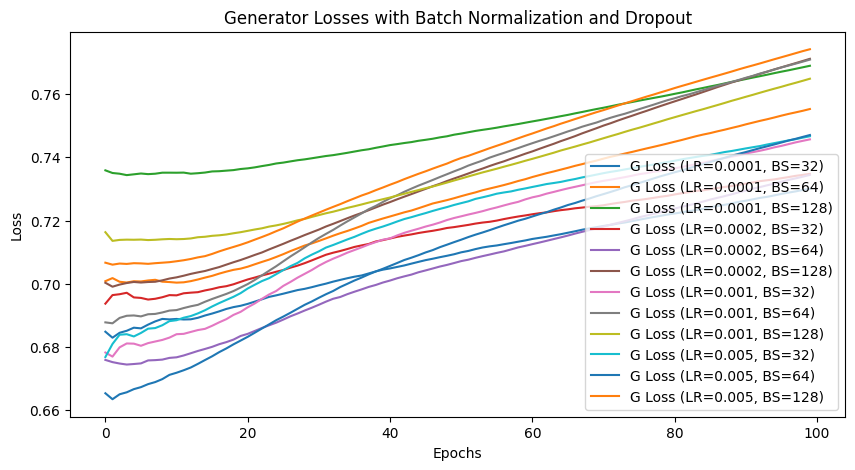

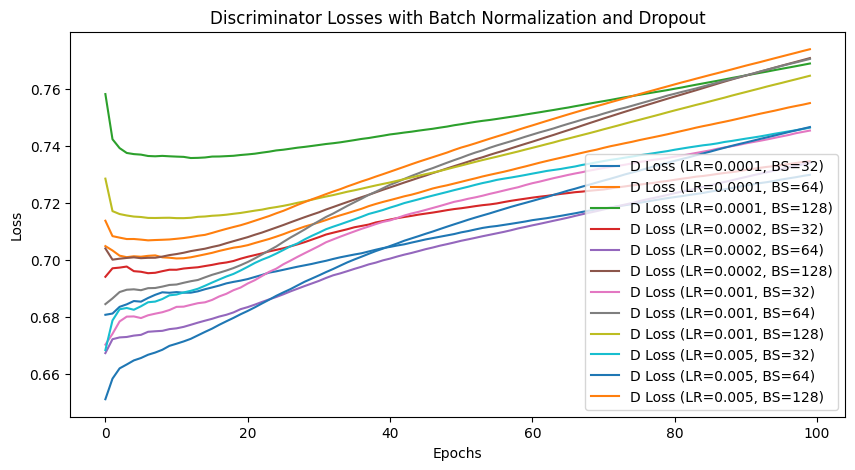

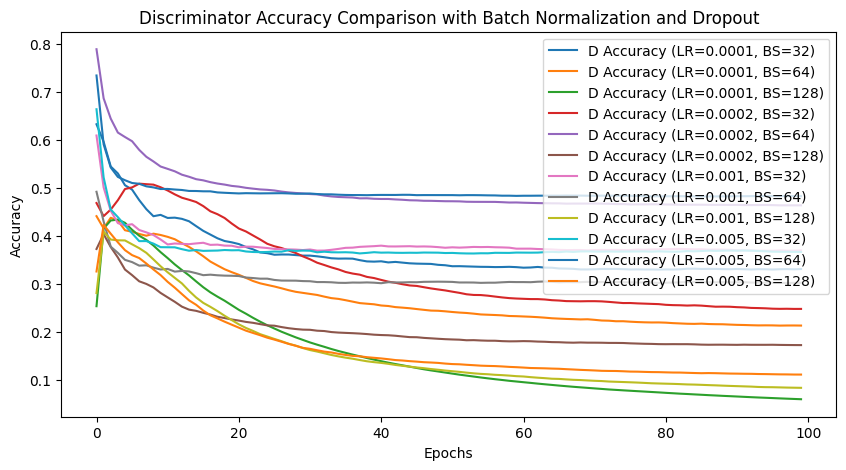

In [21]:
def plot_comparison_bn_dropout(results):
    # Plot Generator and Discriminator Losses separately
    plt.figure(figsize=(10, 5))
    for (lr, batch_size), (g_losses, d_losses, d_accs) in results.items():
        plt.plot(g_losses, label=f"G Loss (LR={lr}, BS={batch_size})")
    plt.title("Generator Losses with Batch Normalization and Dropout")
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    plt.legend()
    plt.savefig("images/generator_losses_bn_dropout.png")
    plt.show()

    plt.figure(figsize=(10, 5))
    for (lr, batch_size), (g_losses, d_losses, d_accs) in results.items():
        plt.plot(d_losses, label=f"D Loss (LR={lr}, BS={batch_size})")
    plt.title("Discriminator Losses with Batch Normalization and Dropout")
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    plt.legend()
    plt.savefig("images/discriminator_losses_bn_dropout.png")
    plt.show()

    # Plot Discriminator Accuracy separately
    plt.figure(figsize=(10, 5))
    for (lr, batch_size), (g_losses, d_losses, d_accs) in results.items():
        plt.plot(d_accs, label=f"D Accuracy (LR={lr}, BS={batch_size})")
    plt.title("Discriminator Accuracy Comparison with Batch Normalization and Dropout")
    plt.xlabel("Epochs")
    plt.ylabel("Accuracy")
    plt.legend()
    plt.savefig("images/discriminator_accuracy_bn_dropout.png")
    plt.show()

plot_comparison_bn_dropout(results_bn_dropout)
